### Mounting Drive into Google Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### Importing custom functionalitites

In [2]:
# Custom functionalities path
import sys
sys.path.append('/content/drive/MyDrive/')

In [3]:
#Standard Dependencies
import pandas as pd
import xgboost
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

In [4]:
#Custom Functionalities
import module_lithopred
from module_lithopred.data_formating import formating
from module_lithopred.plotting import raw_logs, augmented_logs, litho_prediction
from module_lithopred.preprocessing import preprocess_data
from module_lithopred.augmentation import data_augmentation
from module_lithopred.input_norm import normalization
from module_lithopred.additional_functions import matrix_score, confusion_matrix

#### Importing data

In [5]:
#Data directory
directory = '/content/drive/MyDrive/Thesis_data/'

In [6]:
#training dataset
raw_training = pd.read_csv(directory + 'train.csv', sep=';')

#open dataset
test_data = pd.read_csv(directory + 'test.csv', sep=';')
test_labels = pd.read_csv(directory + 'test_target.csv', sep=';')
raw_test = pd.merge(test_data, test_labels, on=['WELL', 'DEPTH_MD'])

#hidden dataset
raw_hidden = pd.read_csv(directory + 'hidden_test.csv', sep=';')

In [7]:
#Data formating

'''
Data columns are renamed and lithofacies classes are mapped to values
from 0 to 11, and intepretation confidence is dropped.
'''

training_form, test_form, hidden_form = formating(raw_training, raw_test, raw_hidden)

In [8]:
#Inspecting raw data
display(training_form.head())

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,RDEP,RHOB,GR,SGR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,LITHO
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,NaN,NaN,NaN,2
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,NaN,NaN,NaN,2
2,15/9-13,494.832,437641.96875,6470972.5,-469.805786,NORDLAND GP.,NaN,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,NaN,NaN,NaN,2
3,15/9-13,494.984,437641.96875,6470972.5,-469.957794,NORDLAND GP.,NaN,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,NaN,NaN,NaN,2
4,15/9-13,495.136,437641.96875,6470972.5,-470.109772,NORDLAND GP.,NaN,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,NaN,NaN,NaN,2


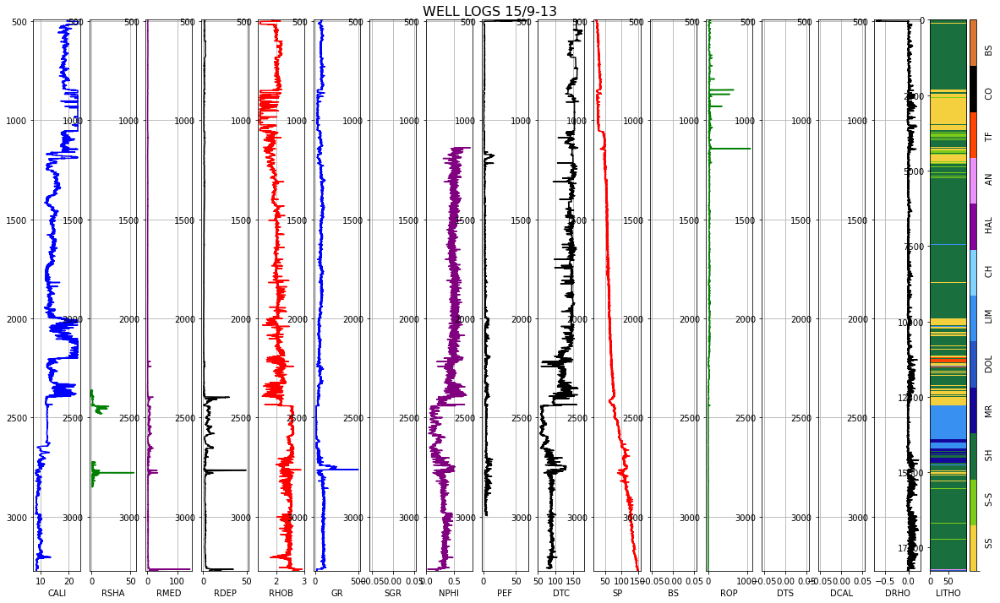

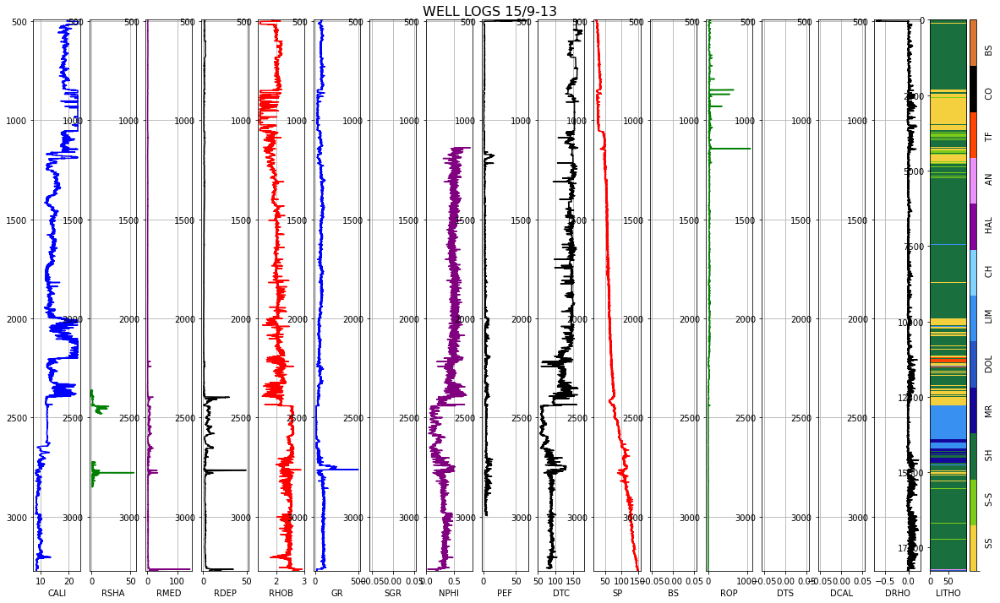

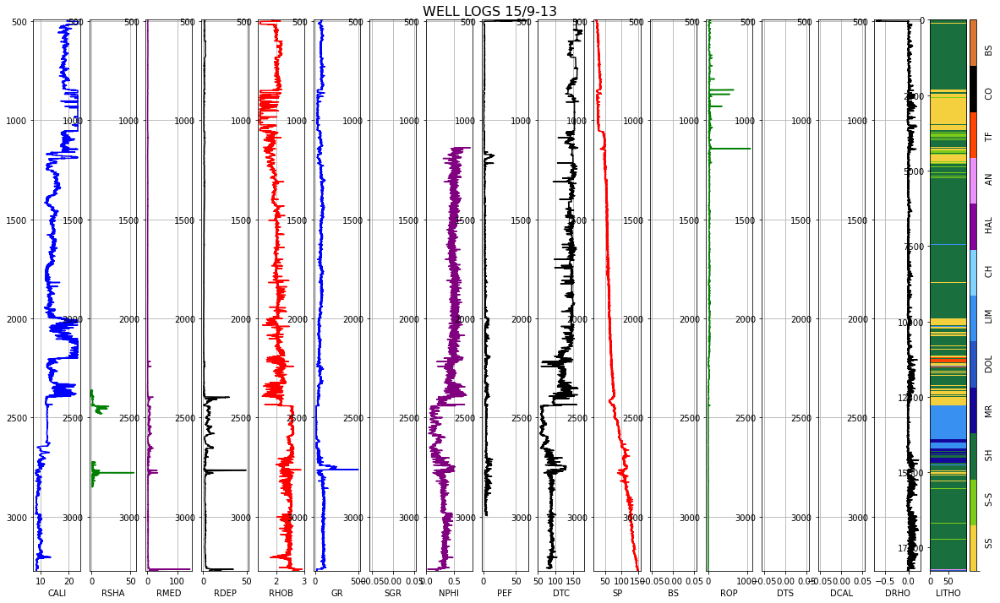

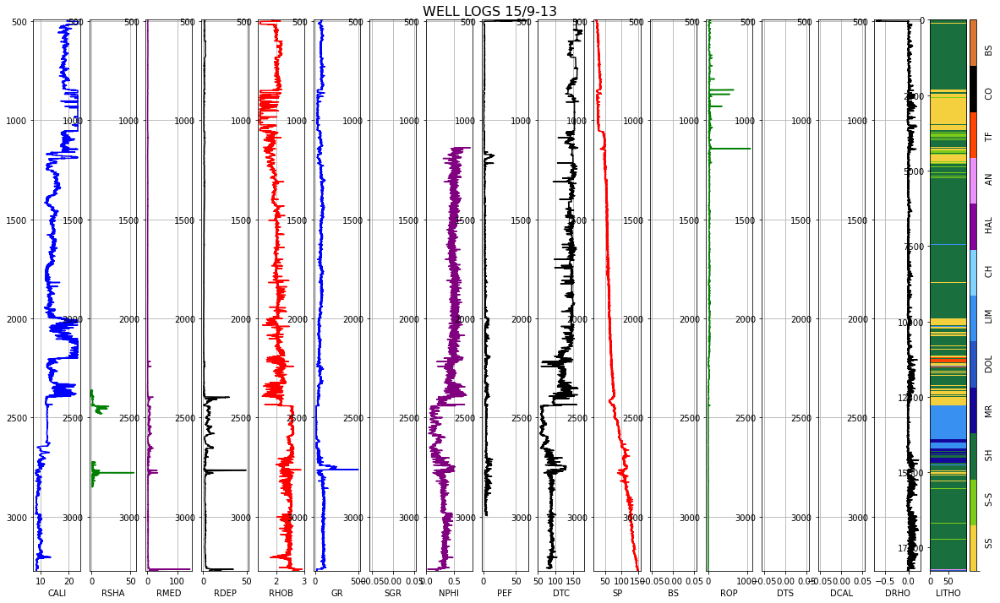

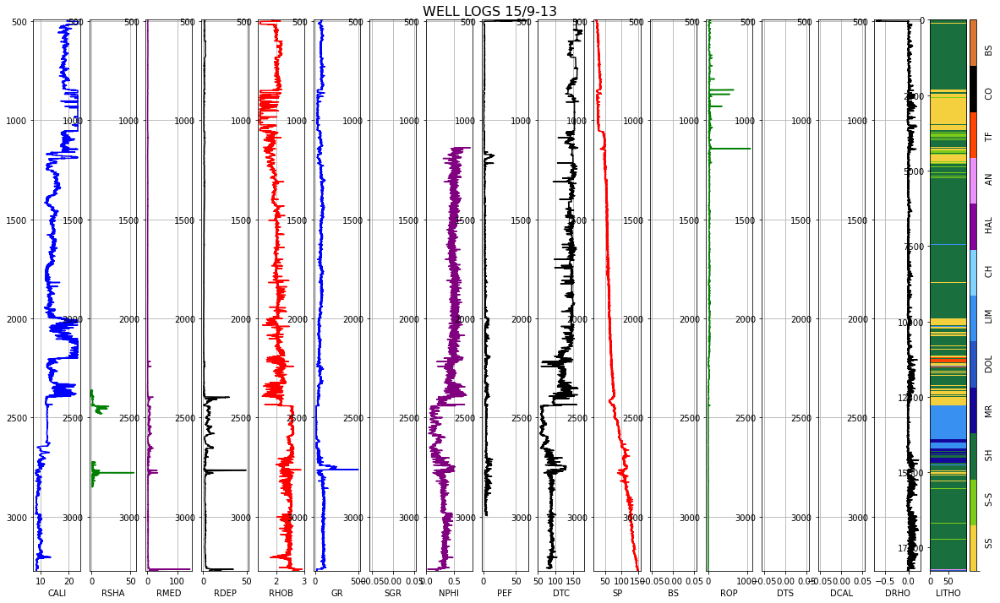

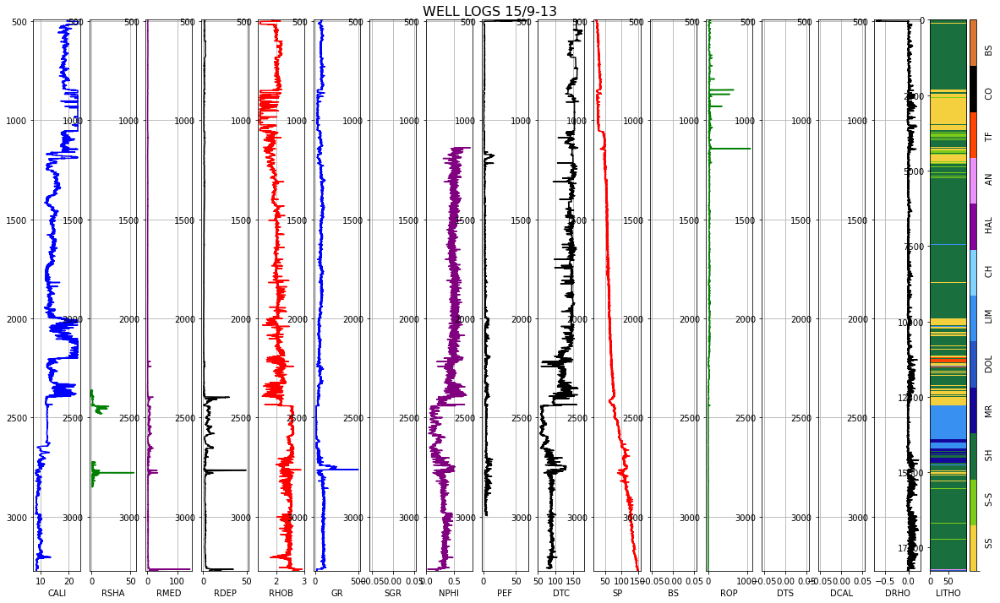

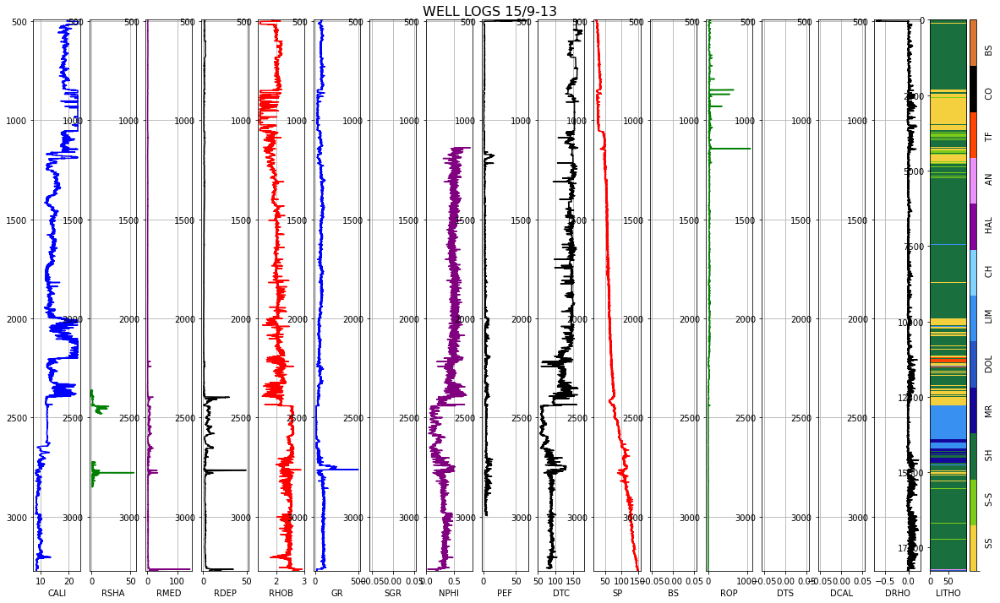

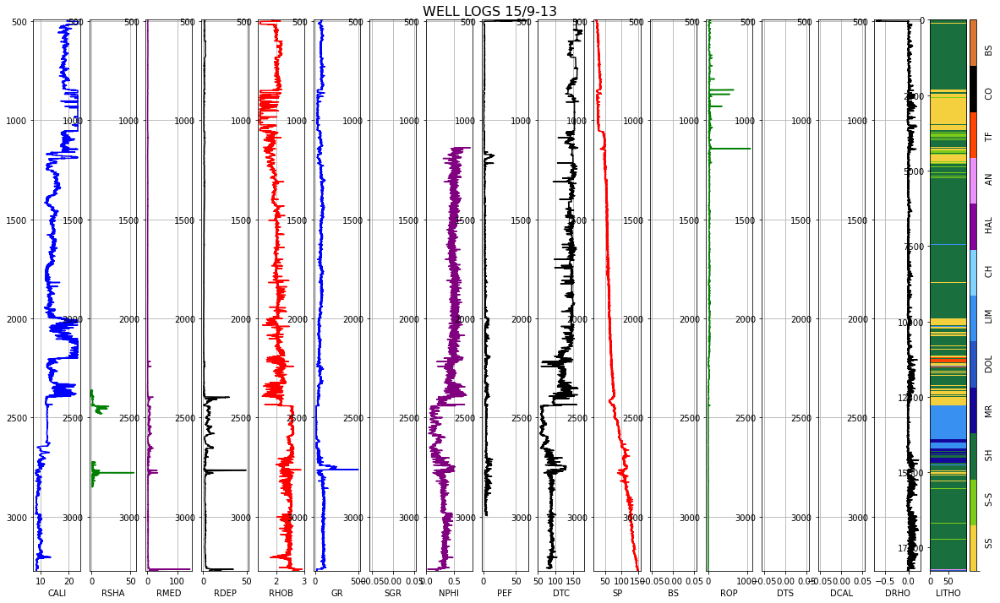

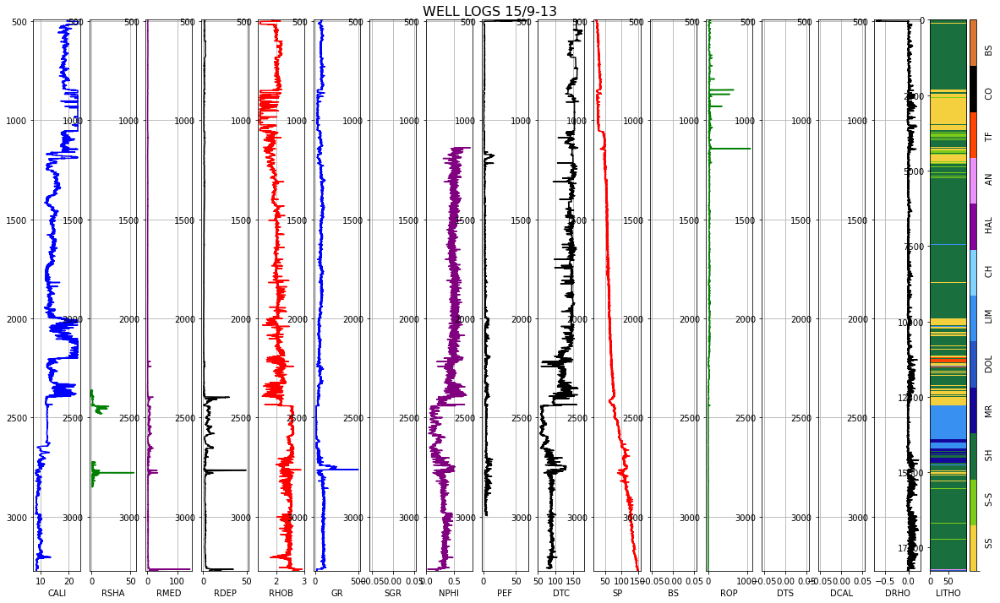

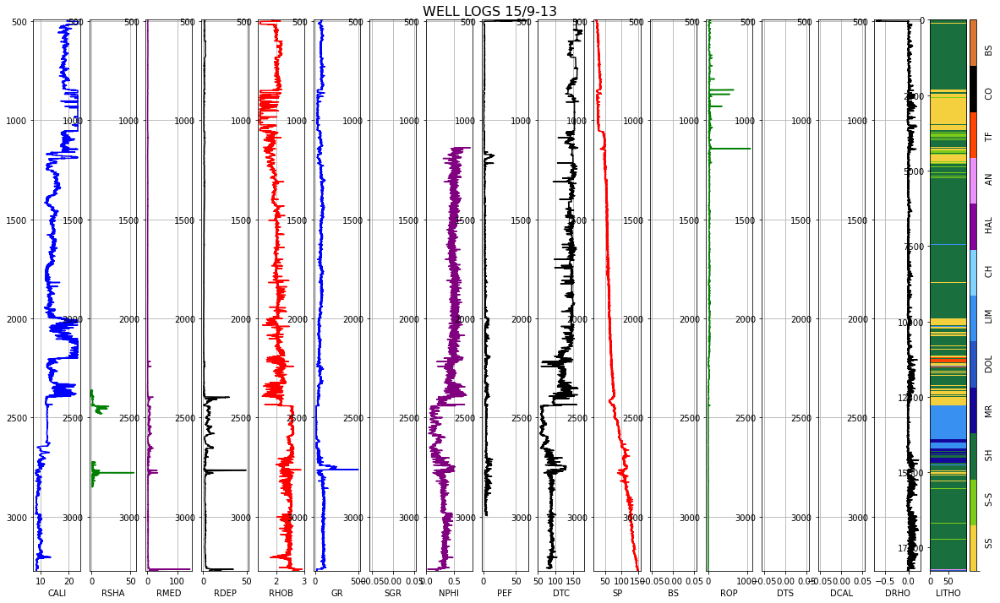

In [9]:
for i in range(10, 20):
  raw_logs(training_form, 0)

#### Data Pre-processing

In [10]:
#Pre-processing datasets

'''
Preprocessing involves dropping unncesary cols, encoding categorical variables,
and incorporating well location clustering as feature prior to feature augmentation.

----------------See prerpocessing.py for deatils----------------
'''

trainingdata, testdata, hiddendata = preprocess_data(training_form, test_form, hidden_form)

In [11]:
#Checking data structure befrore augmentation
display(trainingdata.head())

,Cluster,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,RMIC,LITHO,GROUP_encoded,FORMATION_encoded,WELL_encoded
0,0,494.528,437641.96875,6470972.5,-469.501831,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,2,6,-1,0
1,0,494.680,437641.96875,6470972.5,-469.653809,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,2,6,-1,0
2,0,494.832,437641.96875,6470972.5,-469.805786,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,2,6,-1,0
3,0,494.984,437641.96875,6470972.5,-469.957794,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,2,6,-1,0
4,0,495.136,437641.96875,6470972.5,-470.109772,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,2,6,-1,0


#### Feature augmentation by Machine-learning

In [12]:
#Data Augmentation by implementing Machine Learning

'''
Firts, each regressor takes as training data the 80% of the features where
the log being predicted is present, later each regresor is validated on the 
remanent 20% of this data.

Second, each regression model predictcs and imputes an approximate value 
where the predicted log readings were originally missing on the
training, open, and hidden sets.

Finally, some other additional features are created.

----------------See argumentation.py for details----------------
'''

training_aug, test_aug, hidden_aug = data_augmentation(trainingdata, testdata, hiddendata)

-----------------------------------------PREDINCTING DTS------------------------------------------
Training set shape (122229, 23) and validation set shape (52384, 23)
[00:18:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:194.562
Will train until validation_0-rmse hasn't improved in 100 rounds.
[99]	validation_0-rmse:16.2272
Train set root mean squared error: 16.267693130174084
Validation set root mean squared error: 16.227240670261597
--------------------------------Imputing DTS LOG by ML predictions--------------------------------
----------------------------------------PREDINCTING NPHI-----------------------------------------
Training set sahpe (535786, 23) and validation set shape (229623, 23)
[00:18:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.194123
Will train until validation_0-rmse hasn'

In [13]:
#inspecting dataframe after augmentation
display(training_aug.head())

,Cluster,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,RMIC,LITHO,GROUP_encoded,FORMATION_encoded,WELL_encoded,DTS_pred,DTS_COMB,NPHI_pred,NPHI_COMB,RHOB_pred,RHOB_COMB,DTC_pred,DTC_COMB,S_I,P_I,DT_R,G,K,MD_TVD
0,0,494.528,437641.96875,6470972.5,-469.501831,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,2,6,-1,0,374.483521,374.483521,0.559608,0.559608,1.811603,1.884186,162.041351,161.131180,5031.425117,11693.489697,0.430276,1.343564e+07,5.465706e+07,1.053304
1,0,494.680,437641.96875,6470972.5,-469.653809,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,2,6,-1,0,374.483521,374.483521,0.559608,0.559608,1.811603,1.889794,162.041351,160.603470,5046.399672,11766.828680,0.428867,1.347563e+07,5.529884e+07,1.053286
2,0,494.832,437641.96875,6470972.5,-469.805786,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,2,6,-1,0,374.483521,374.483521,0.557093,0.557093,1.811603,1.896523,162.041351,160.173615,5064.369075,11840.419324,0.427719,1.352361e+07,5.589093e+07,1.053269
3,0,494.984,437641.96875,6470972.5,-469.957794,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,2,6,-1,0,378.218445,378.218445,0.559608,0.559608,1.811603,1.891913,163.542114,160.149429,5002.169629,11813.422165,0.423431,1.322561e+07,5.613085e+07,1.053252
4,0,495.136,437641.96875,6470972.5,-470.109772,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,2,6,-1,0,378.218445,378.218445,0.559608,0.559608,1.811603,1.880034,163.542114,160.128342,4970.762571,11740.795349,0.423375,1.314257e+07,5.579773e+07,1.053235


In [14]:
#plotting
#Dataframes containing the predicted logs
cols_needed = ['DTS', 'DTS_pred', 'DTS_COMB', 'NPHI', 'NPHI_pred', 'NPHI_COMB', 'RHOB', 'RHOB_pred', 'RHOB_COMB', 'DTC', 'DTC_pred', 'DTC_COMB', 'LITHO']

train_predicted_logs = pd.concat((raw_training[['WELL', 'DEPTH_MD']], training_aug[cols_needed].reset_index()), axis=1)
test_predicted_logs = pd.concat((raw_test[['WELL', 'DEPTH_MD']], test_aug[cols_needed].reset_index()), axis=1)
hidden_predicted_logs = pd.concat((raw_hidden[['WELL', 'DEPTH_MD']], hidden_aug[cols_needed].reset_index()), axis=1)

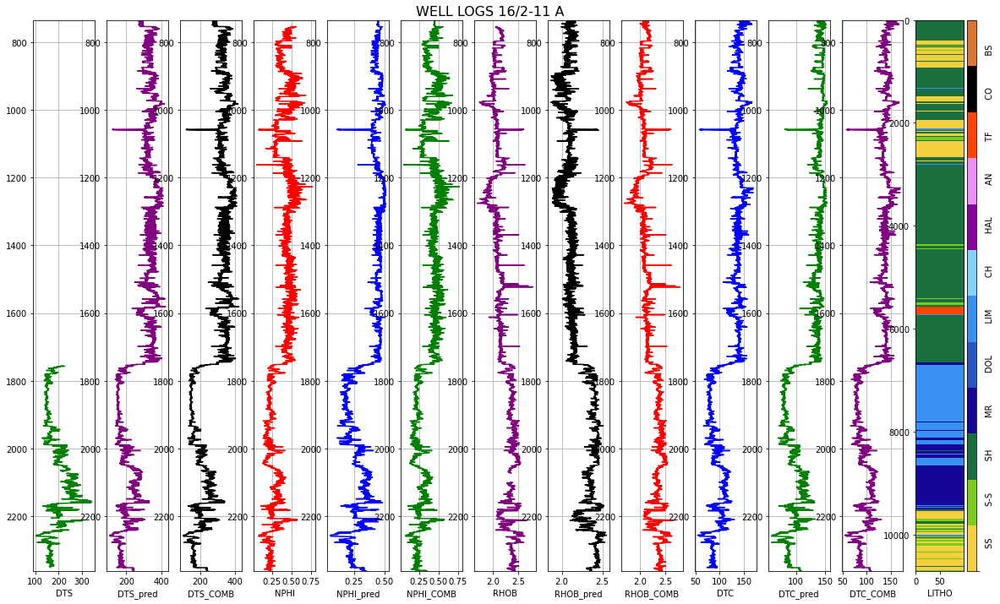

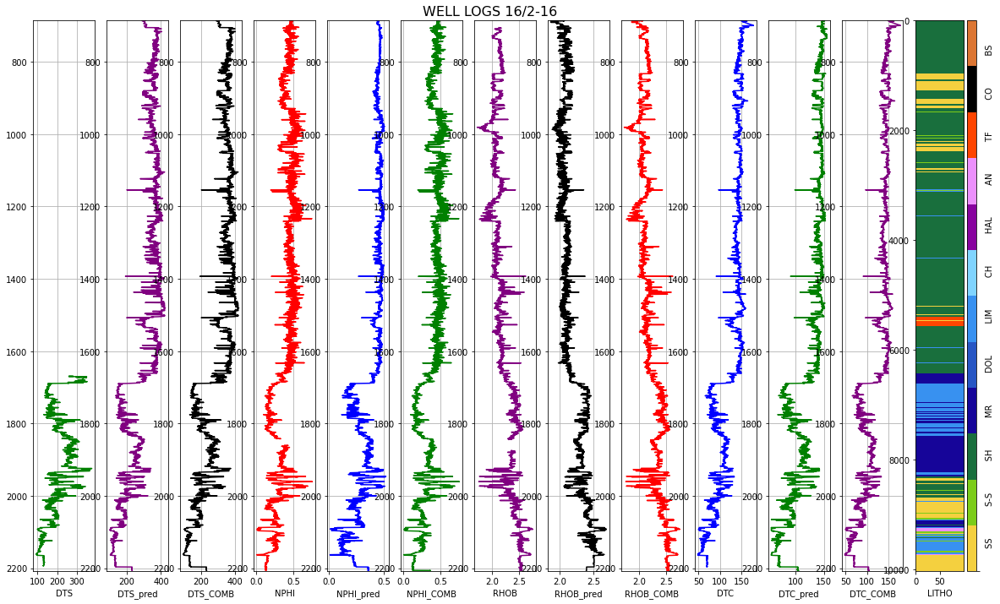

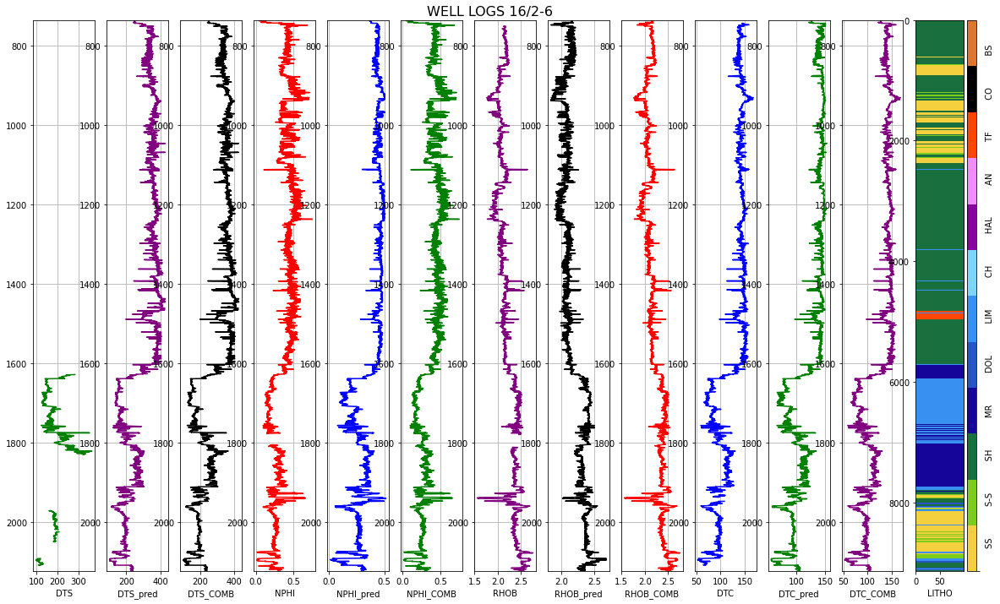

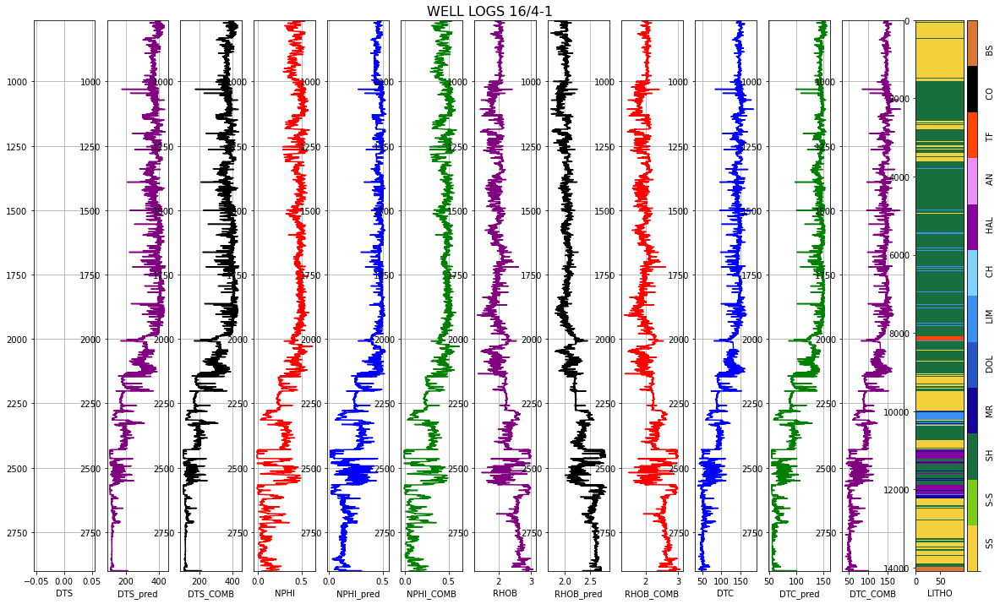

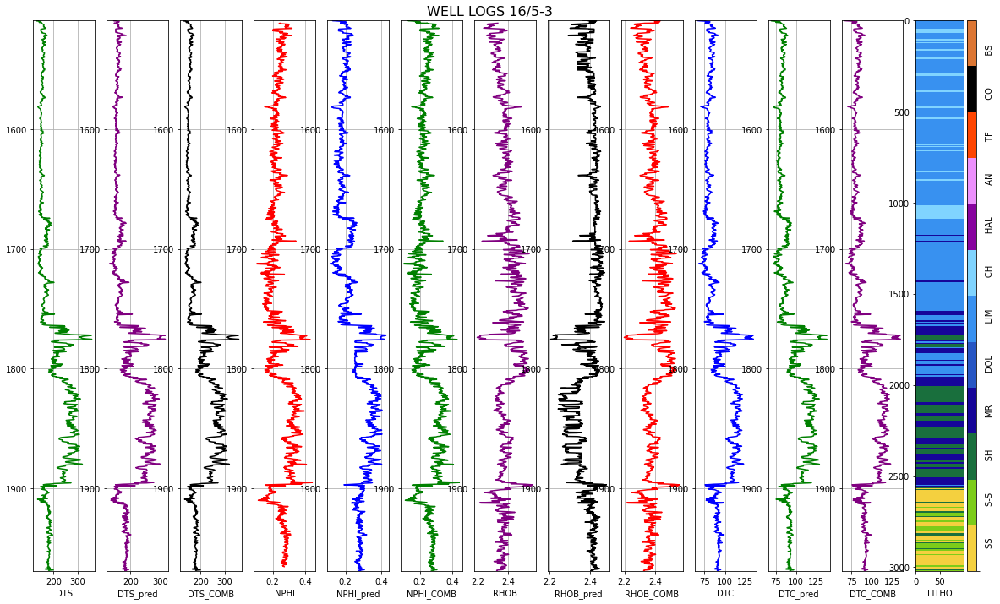

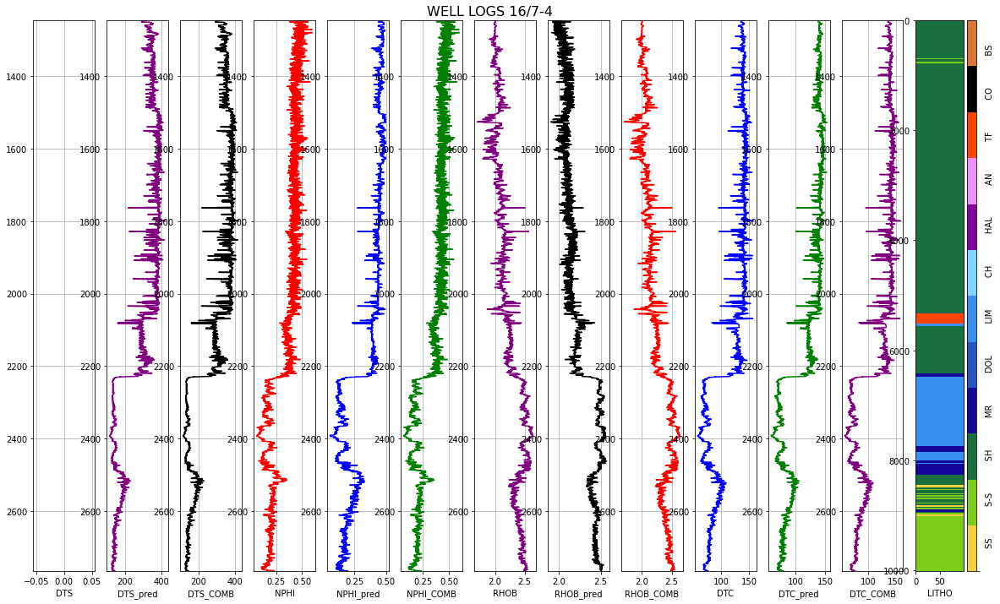

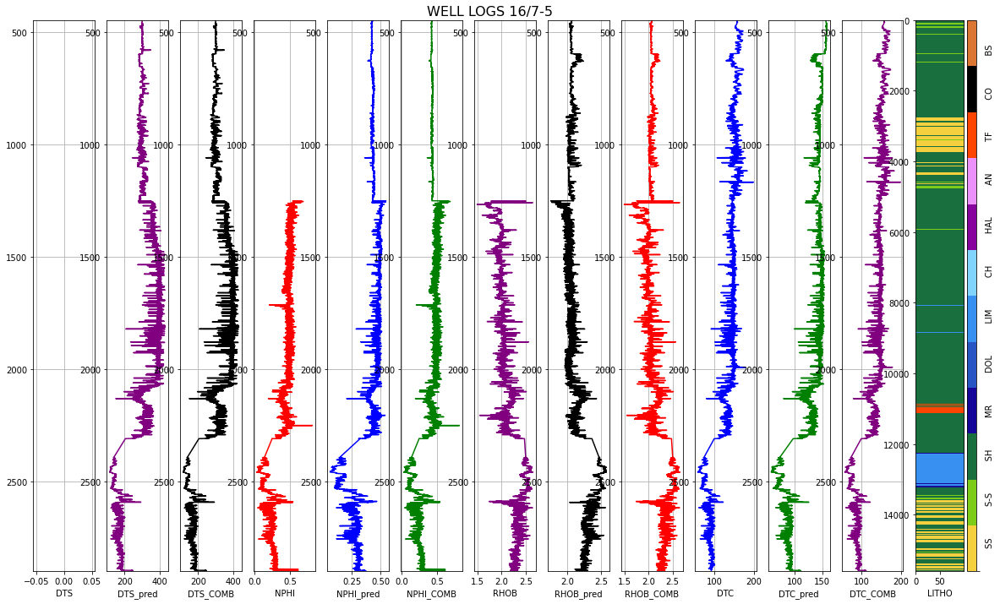

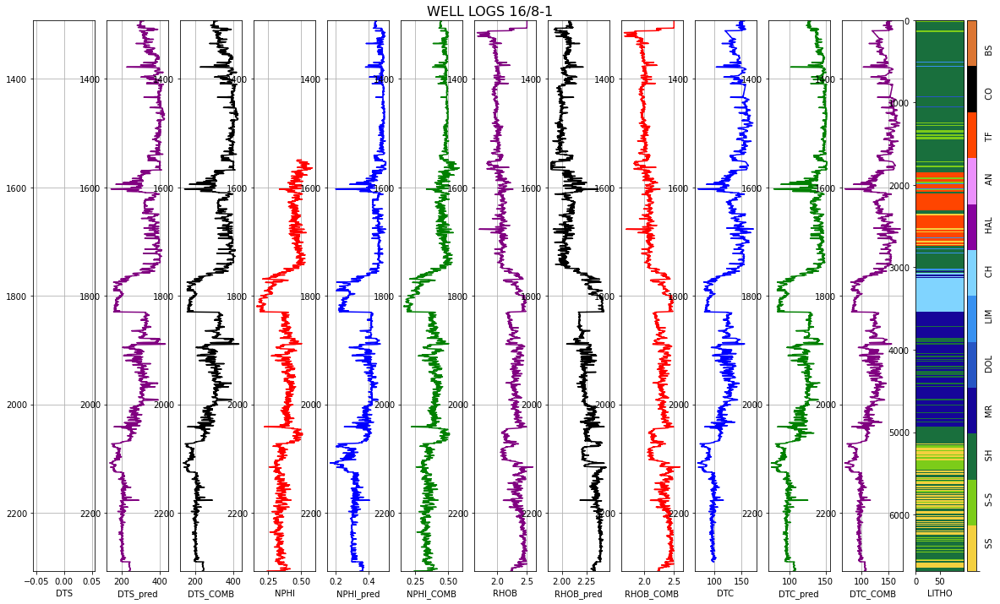

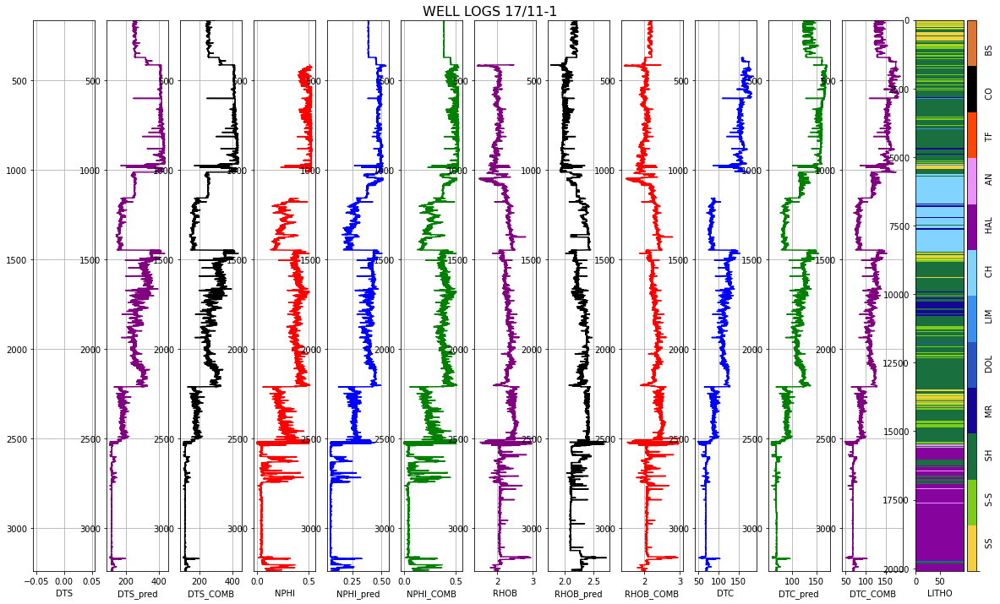

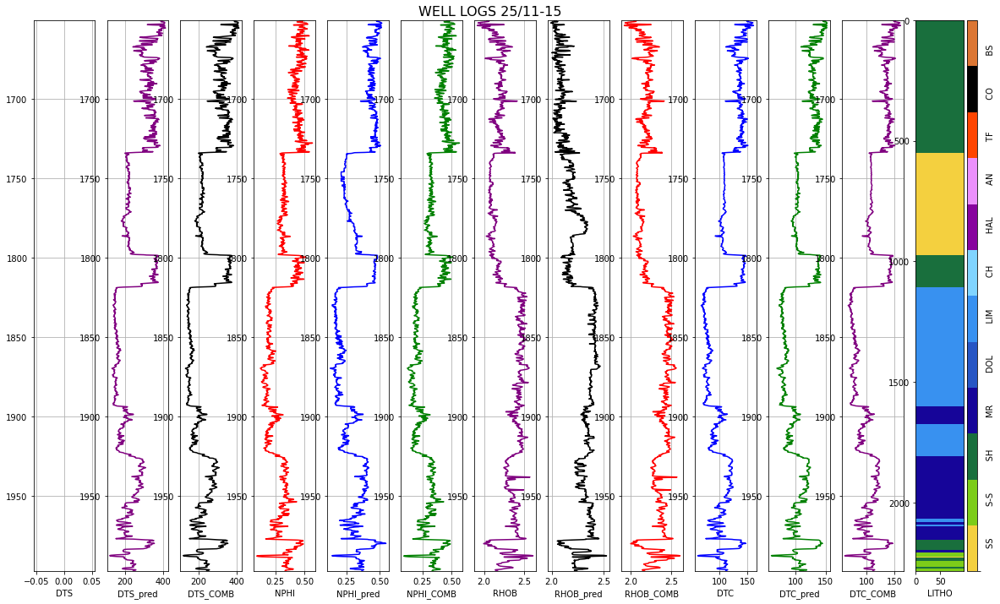

In [15]:
#Predicted Logs Visualization
for i in range(10, 20):
  augmented_logs(train_predicted_logs, i)

#### Data Normalization

In [16]:
'''
First the features that weere not augmented by machine-learning
were inputed by median inputation technique.

Later, onche several normalization techniques were tested, 
StandardScaler was used to standardize the data.

'''

train_norm, test_norm, hidden_norm = normalization(training_aug, test_aug, hidden_aug)

#### eXTREME GRADIENT BOOSTING MODEL (XGB)

In [17]:
#Feature Selection

'''
These features were selected based on a Recursive Feature
Elimination Proces (28 features/30 in total).
'''
selected_fetures_xgb = ['RDEP', 'GR', 'NPHI_COMB', 'G', 'P_I', 'DTC', 'DTS_COMB', 'RSHA',
                        'DT_R', 'RHOB', 'K', 'DCAL', 'Y_LOC', 'Cluster', 'GROUP_encoded',
                        'WELL_encoded', 'FORMATION_encoded', 'DEPTH_MD', 'Z_LOC', 'CALI', 'BS',
                        'X_LOC', 'RMED', 'PEF', 'SP', 'MD_TVD', 'RMIC', 'DRHO']

x_train = train_norm[selected_fetures_xgb]
y_train = train_norm['LITHO']

x_test = test_norm[selected_fetures_xgb]
y_test = test_norm['LITHO']

x_hidden = hidden_norm[selected_fetures_xgb]
y_hidden = hidden_norm['LITHO']

In [30]:
#XGB model

from sklearn.model_selection import StratifiedKFold
import numpy as np

'''

The model is trained on 10 stratified k-folds, also uses 
the open set as validation set to avoid overfitting
and a 100-round early stopping callback.

The model uses a multi-soft_probability objective function
which returns the probabilities predicted for each class.
This probabilities are computed and stacked by using each k-fold
to give the final prediction.

'''
split = 10
kf = StratifiedKFold(n_splits=split, shuffle=True)

train_prob_xgb1 = np.zeros((len(x_train), 12))
open_prob_xgb1 = np.zeros((len(x_test), 12))
hidden_prob_xgb1 = np.zeros((len(x_hidden), 12))

xgbmodel_noarg = XGBClassifier(
                                '''
                                Hiden
                                Params 
                                Until 
                                Published
                                '''
                                )
i = 1
for (train_index, test_index) in kf.split(x_train, y_train):
  X_train, X_test = x_train.iloc[train_index], x_train.iloc[test_index]
  Y_train, Y_test = y_train.iloc[train_index], y_train.iloc[test_index]

  xgbmodel_noarg.fit(X_train, Y_train.values.ravel(), early_stopping_rounds=100, eval_set=[(X_test, Y_test)], verbose=100)
  prediction = xgbmodel_noarg.predict(X_test)
  print('Fold accuracy:', accuracy_score(Y_test, prediction))

  print(f'-----------------------FOLD {i}---------------------')
    
  train_prob_xgb1 += xgbmodel_noarg.predict_proba(x_train)
  open_prob_xgb1 += xgbmodel_noarg.predict_proba(x_test)
  hidden_prob_xgb1 += xgbmodel_noarg.predict_proba(x_hidden)

  i += 1

train_prob_xgb1 = pd.DataFrame(train_prob_xgb1/split)
train_pred_xgb1 = np.array(pd.DataFrame(train_prob_xgb1).idxmax(axis=1))

open_prob_xgb1 = pd.DataFrame(open_prob_xgb1/split)
open_pred_xgb1 = np.array(pd.DataFrame(open_prob_xgb1).idxmax(axis=1))

hidden_prob_xgb1 = pd.DataFrame(hidden_prob_xgb1/split)
hidden_pred_xgb1 = np.array(pd.DataFrame(hidden_prob_xgb1).idxmax(axis=1))

[0]	validation_0-mlogloss:2.17278
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[100]	validation_0-mlogloss:0.489947
[200]	validation_0-mlogloss:0.421351
[300]	validation_0-mlogloss:0.387934
[400]	validation_0-mlogloss:0.366435
[500]	validation_0-mlogloss:0.3513
[600]	validation_0-mlogloss:0.338522
[700]	validation_0-mlogloss:0.328195
[800]	validation_0-mlogloss:0.319703
[900]	validation_0-mlogloss:0.312446
[999]	validation_0-mlogloss:0.305674
Fold accuracy: 0.8958155349759082
-----------------------FOLD 1---------------------
[0]	validation_0-mlogloss:2.17342
Will train until validation_0-mlogloss hasn't improved in 100 rounds.
[100]	validation_0-mlogloss:0.498591
[200]	validation_0-mlogloss:0.427727
[300]	validation_0-mlogloss:0.393444
[400]	validation_0-mlogloss:0.371581
[500]	validation_0-mlogloss:0.355532
[600]	validation_0-mlogloss:0.342482
[700]	validation_0-mlogloss:0.331507
[800]	validation_0-mlogloss:0.322601
[900]	validation_0-mlogloss:0.315146
[999]	

In [53]:
#Printing Reports 
print('-----------------------TRAIN SET REPORT---------------------')
print('Open set penalty matrix score:', matrix_score(y_train.values, train_pred_xgb1))
print('Open set report:', classification_report(y_train, train_pred_xgb1))
print('-----------------------OPEN SET REPORT---------------------')
print('Open set penalty matrix score:', matrix_score(y_test.values, open_pred_xgb1))
print('Open set report:', classification_report(y_test, open_pred_xgb1))
print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(y_hidden.values, hidden_pred_xgb1))
print('Hidden set report:', classification_report(y_hidden, hidden_pred_xgb1))

-----------------------TRAIN SET REPORT---------------------
Open set penalty matrix score: -0.27052458285312997
Open set report:               precision    recall  f1-score   support

           0       0.87      0.86      0.87    168937
           1       0.81      0.69      0.75    150455
           2       0.92      0.97      0.94    720803
           3       0.86      0.80      0.83     33329
           4       0.73      0.25      0.37      1688
           5       0.86      0.70      0.77     56320
           6       0.93      0.94      0.94     10513
           7       0.99      1.00      0.99      8213
           8       0.94      0.91      0.92      1085
           9       0.89      0.93      0.91     15245
          10       0.83      0.71      0.76      3820
          11       0.99      0.85      0.92       103

    accuracy                           0.90   1170511
   macro avg       0.89      0.80      0.83   1170511
weighted avg       0.89      0.90      0.89   1170511

---

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Hidden set penalty matrix score: -0.43951342761668993
Hidden set report:               precision    recall  f1-score   support

           0       0.76      0.86      0.80     14045
           1       0.68      0.44      0.53     12283
           2       0.89      0.94      0.91     71827
           3       0.27      0.33      0.29      4396
           4       0.20      0.10      0.13       287
           5       0.74      0.47      0.58      8374
           6       0.69      0.76      0.72      2905
           7       0.99      0.99      0.99      6498
           8       0.72      0.69      0.71       597
           9       0.57      0.49      0.53       941
          10       0.79      0.71      0.75       244

    accuracy                           0.82    122397
   macro avg       0.66      0.62      0.63    122397
weighted avg       0.81      0.82      0.81    122397



#### Plotting Results

In [34]:
#Storing results
train_xgb_res = training_form.copy()
test_xgb_res = test_form.copy()
hidden_xgb_res = hidden_form.copy()

#Appending predictions to a copy of the original datasets
train_xgb_res['XGB_TM'] = train_pred_xgb1
test_xgb_res['XGB_TM'] = open_pred_xgb1
hidden_xgb_res['XGB_TM'] = hidden_pred_xgb1

##### Training Set Results

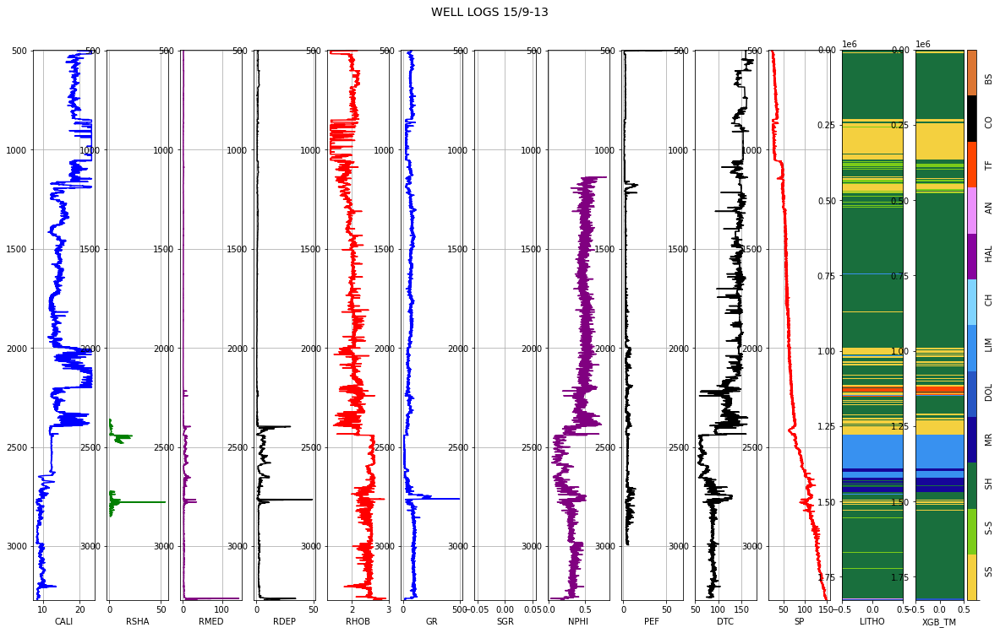

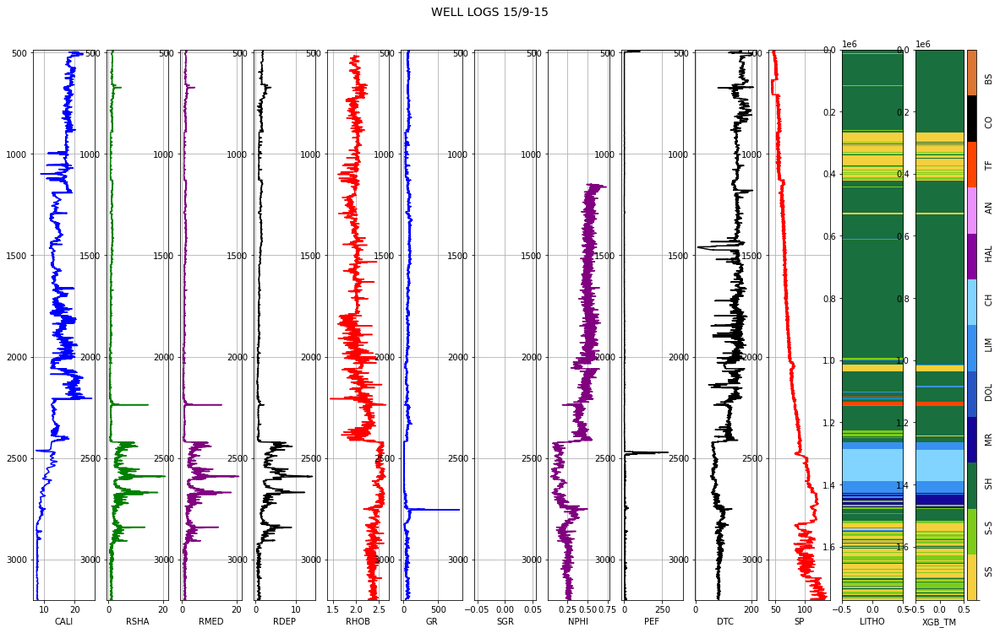

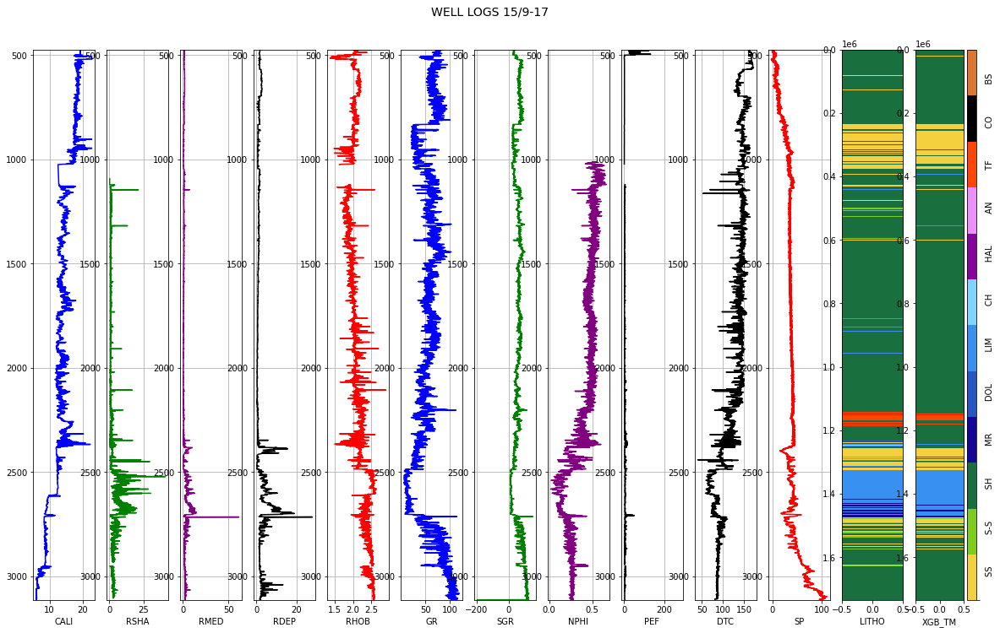

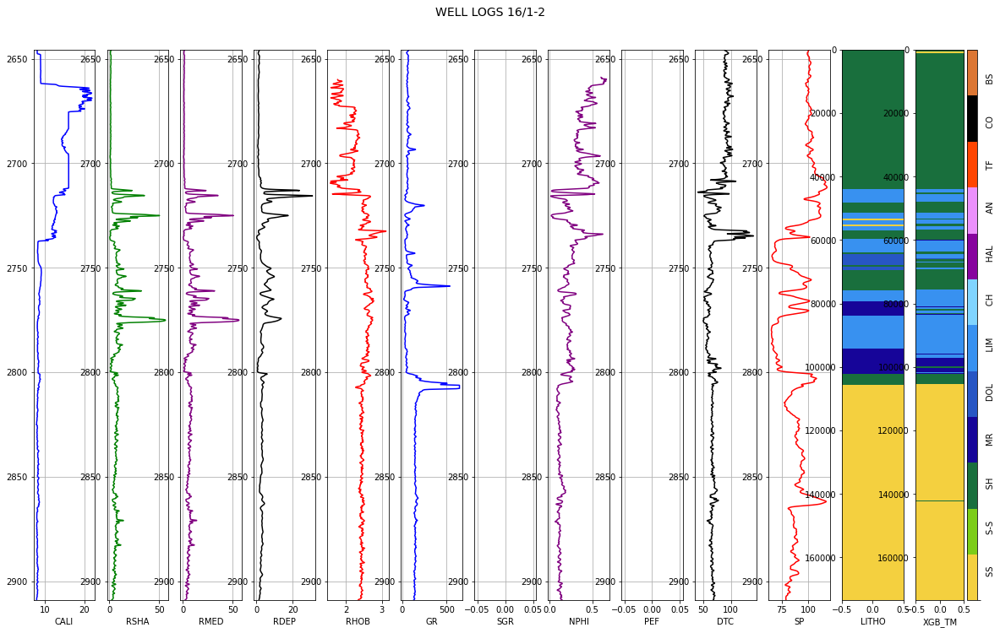

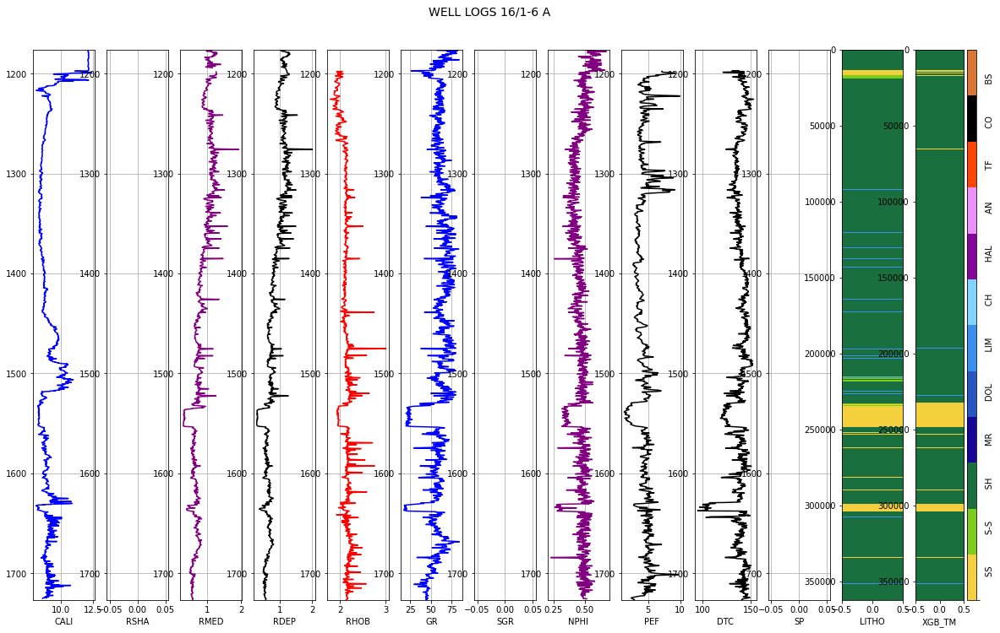

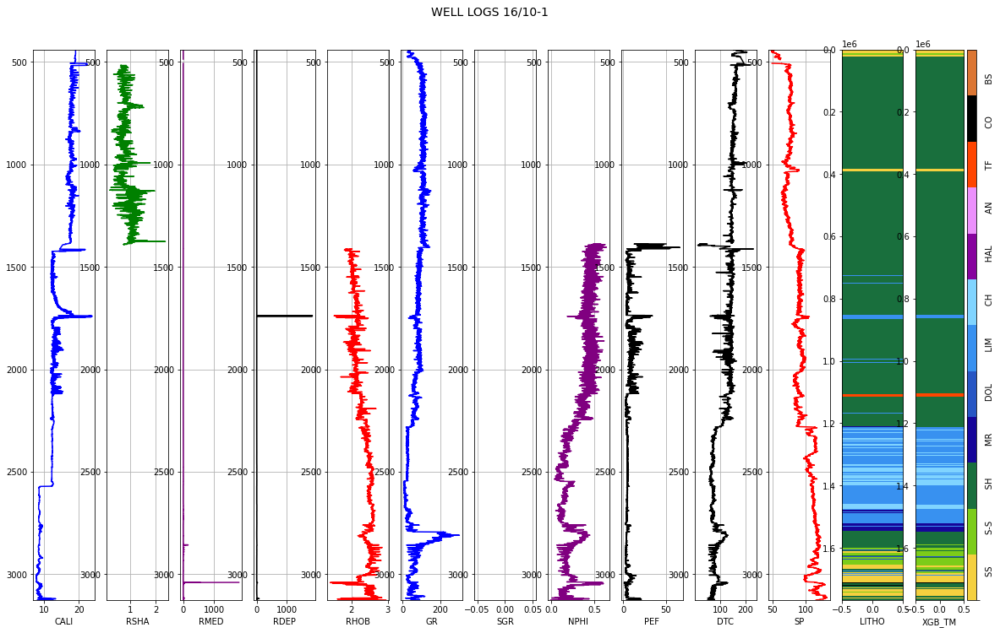

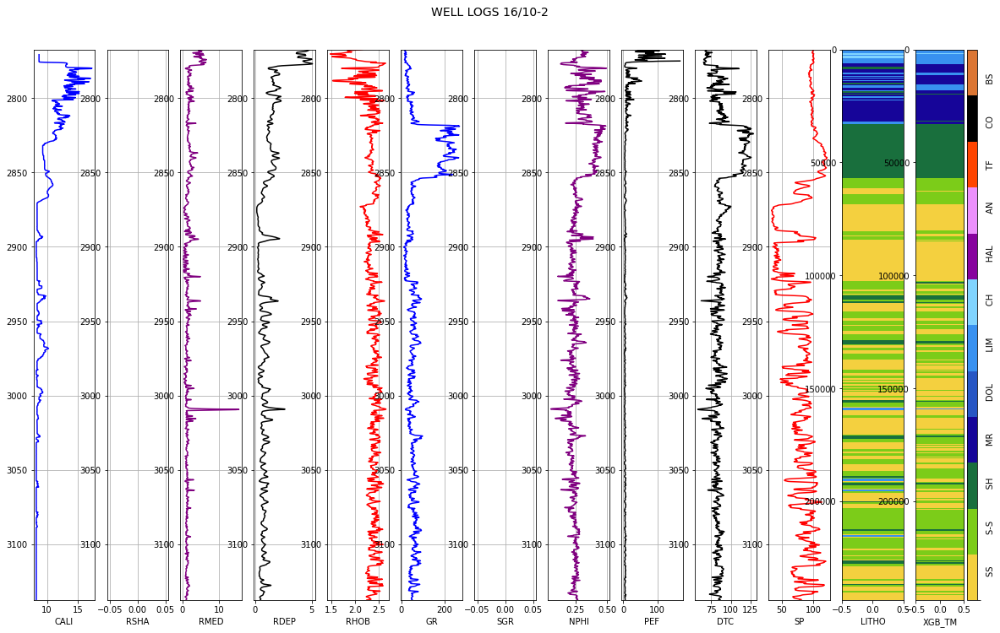

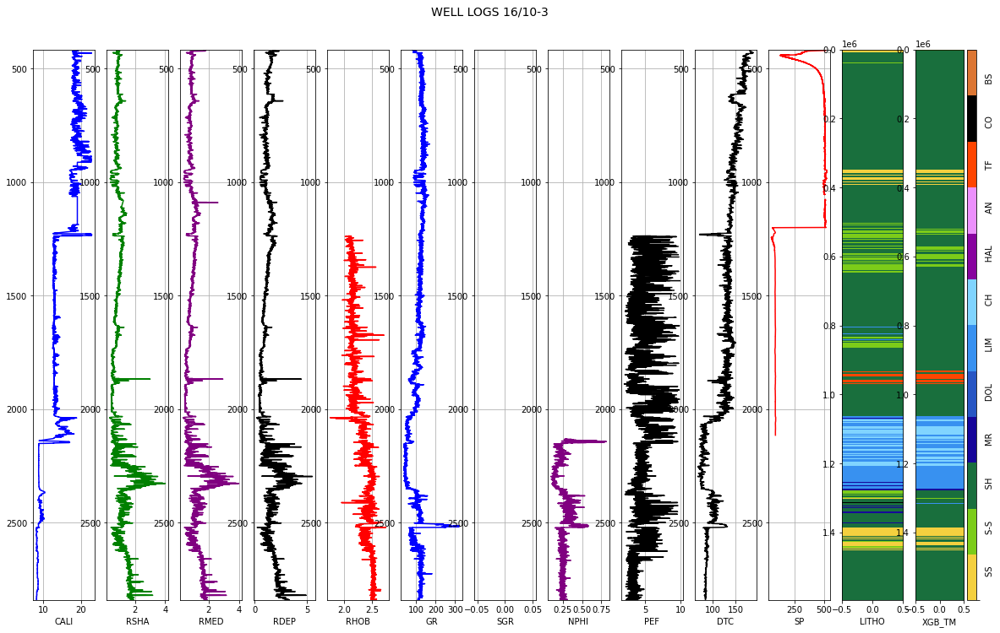

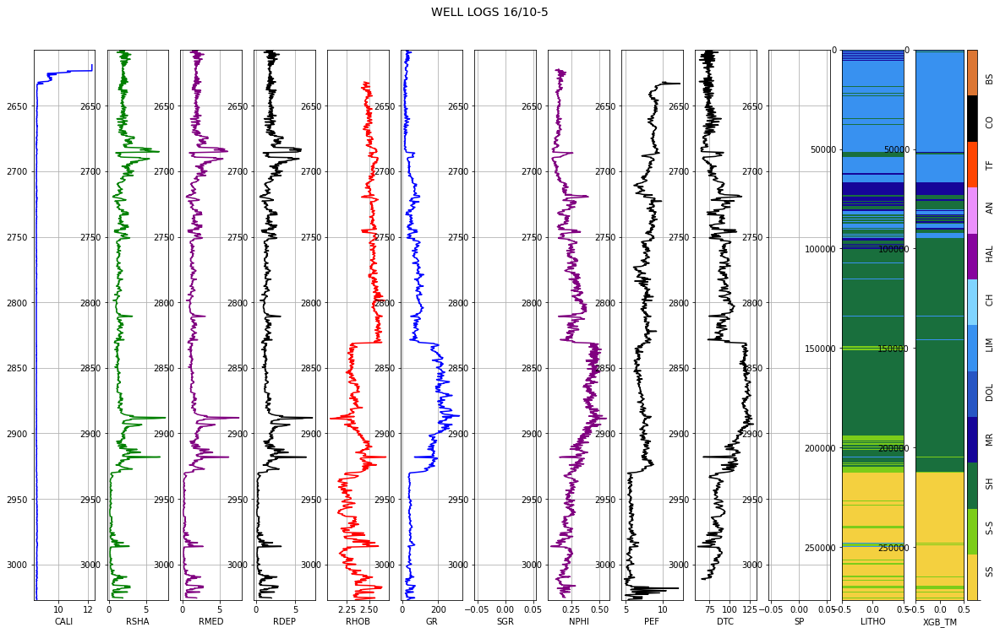

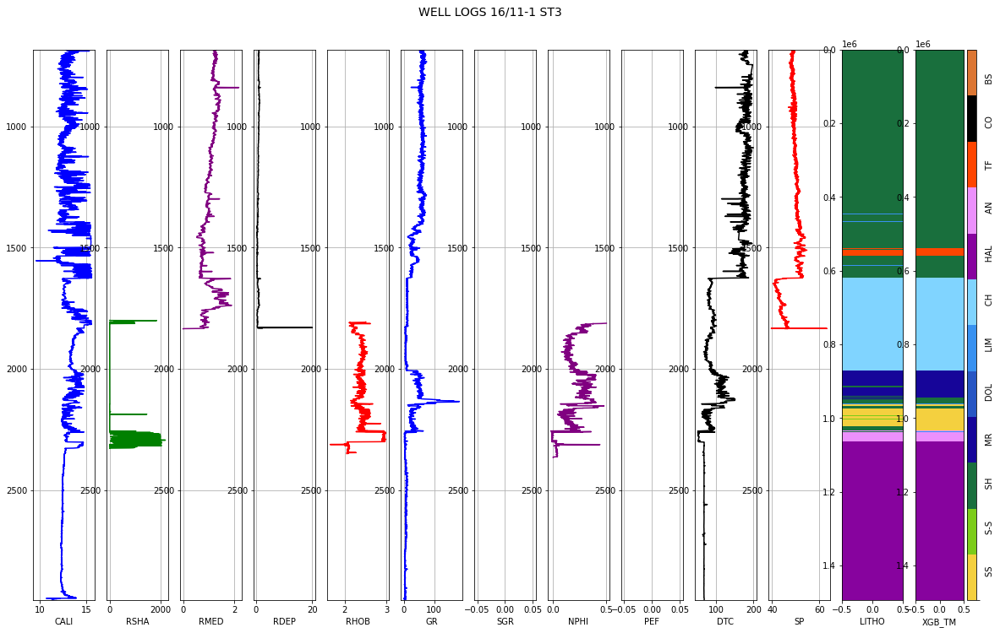

In [ ]:
#Plotting HIDDEN SET results
for i in range(10):
  litho_prediction(train_xgb_res, i, 1)

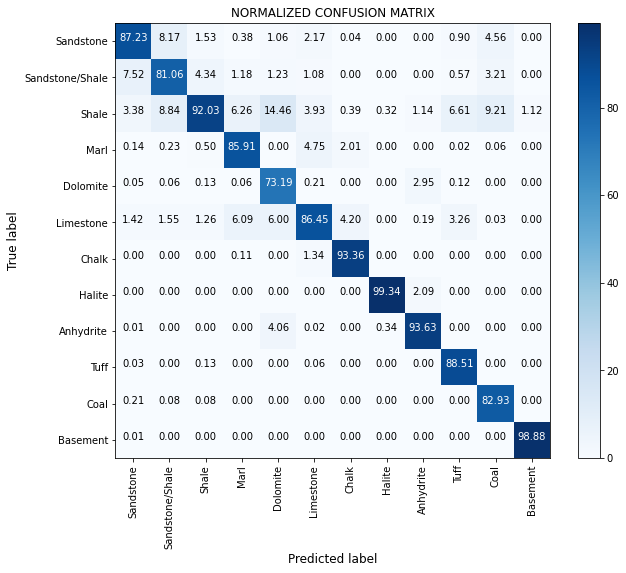

In [ ]:
confusion_matrix(y_train.values, train_pred_xgb1)

##### Hidden Set Results

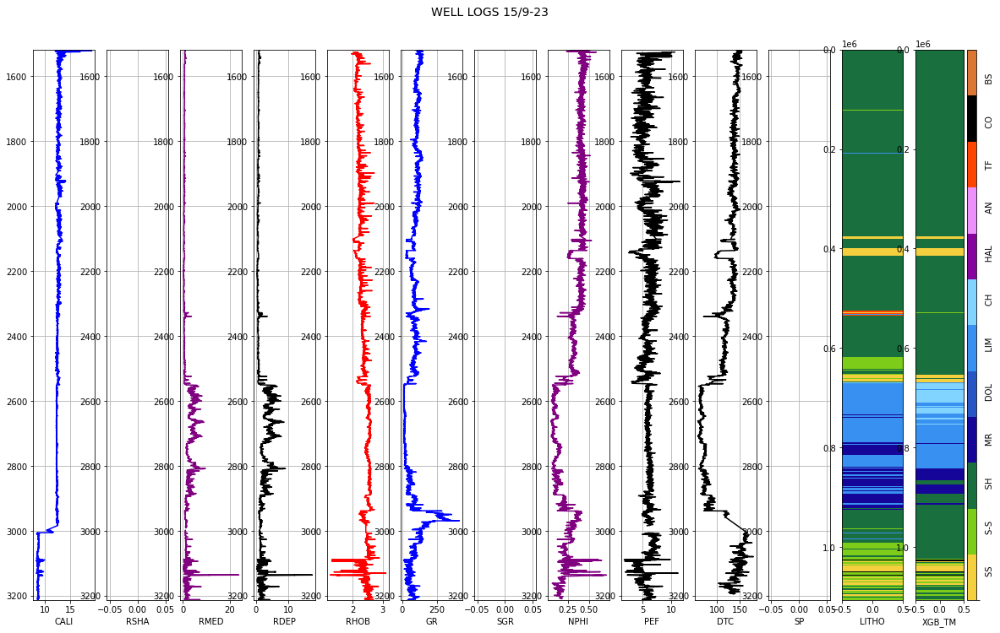

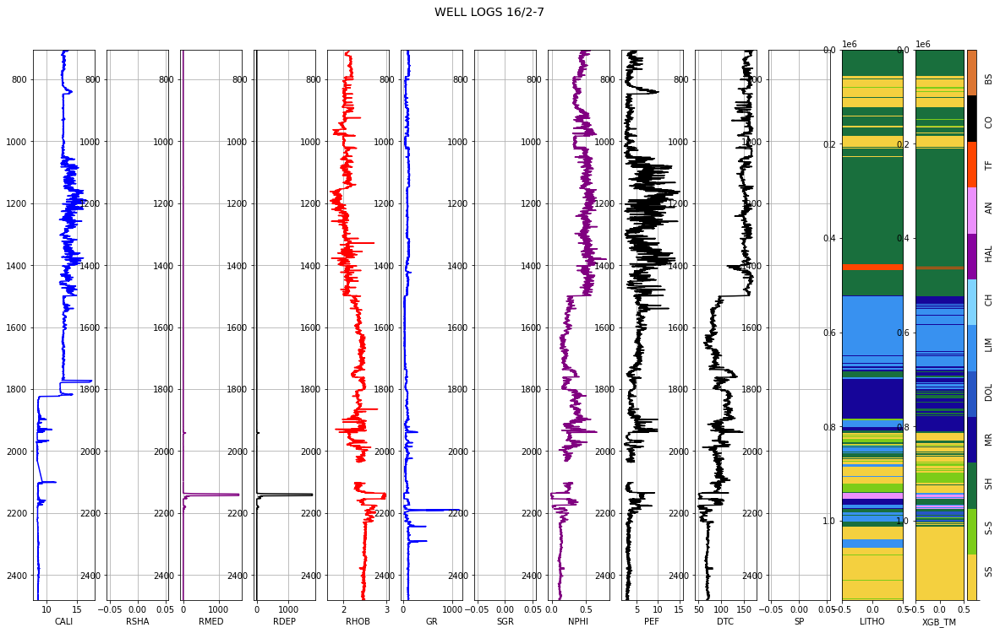

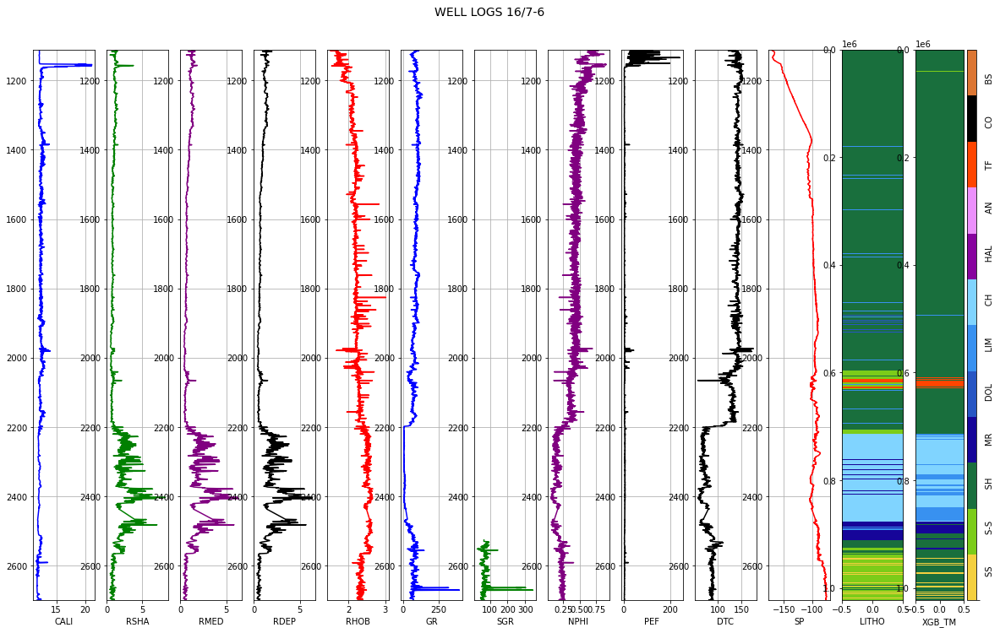

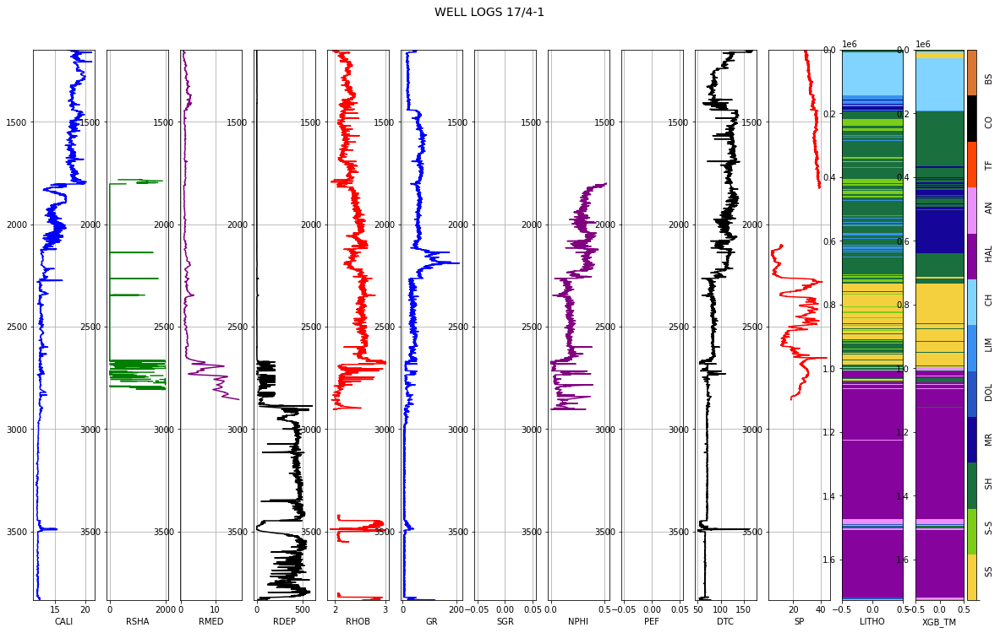

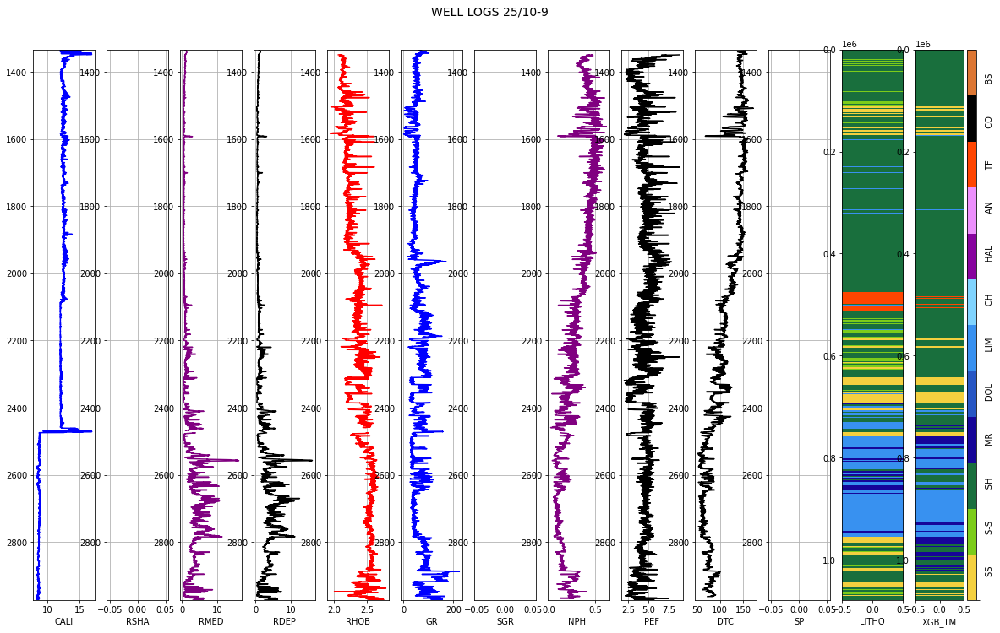

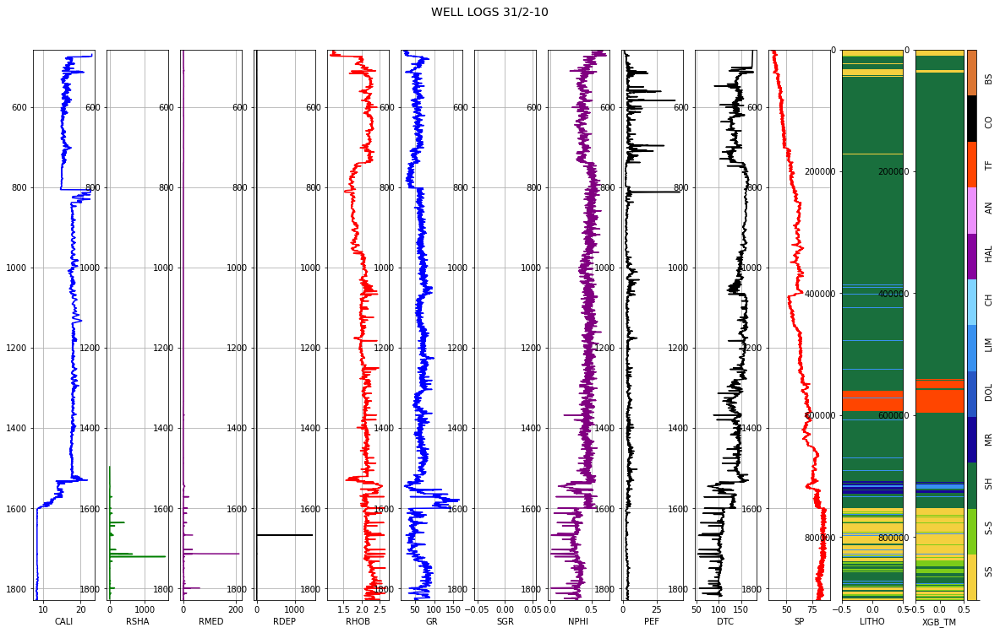

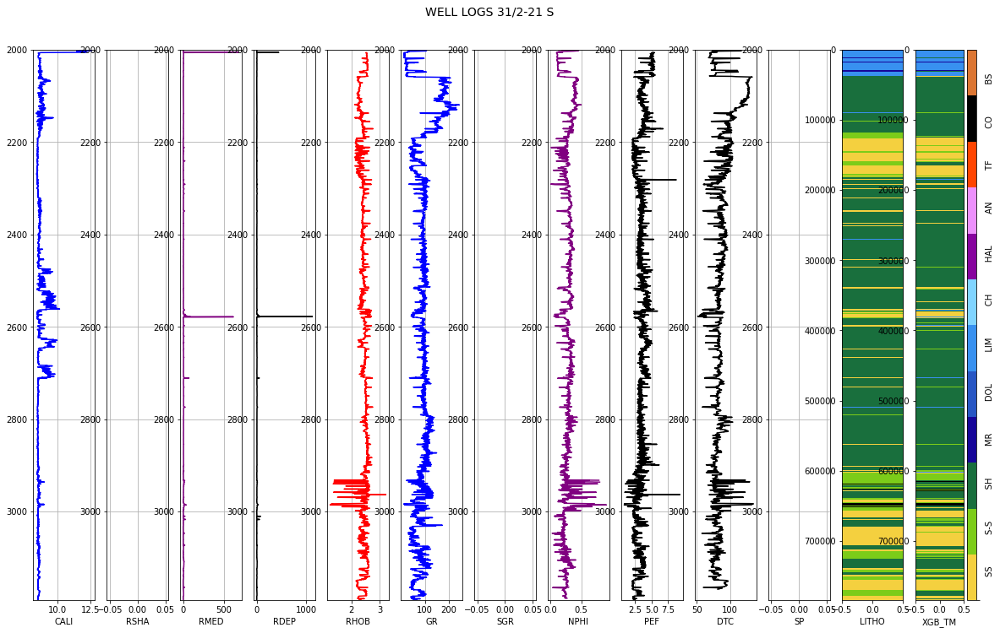

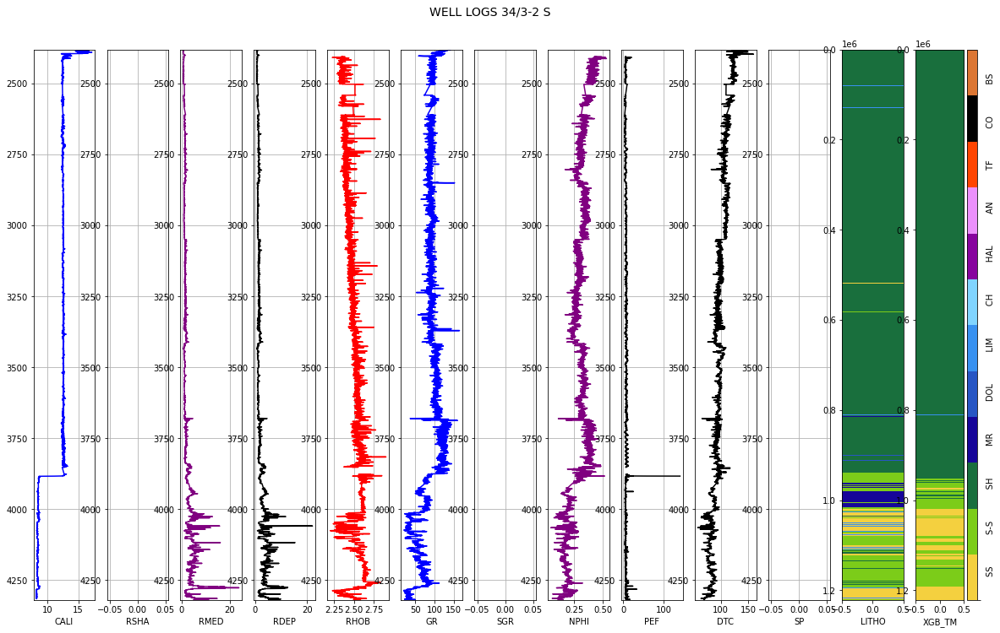

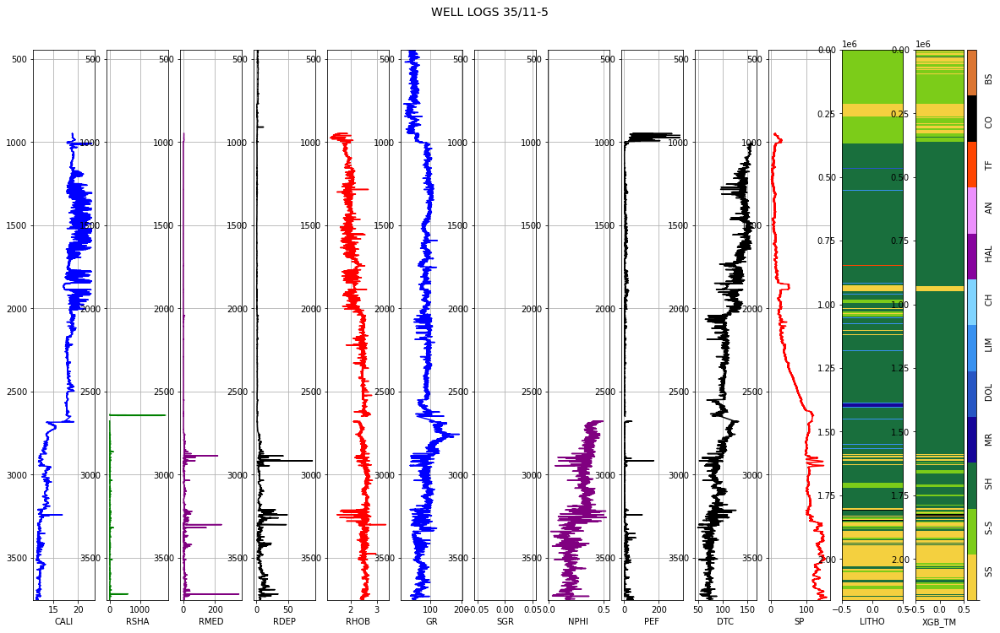

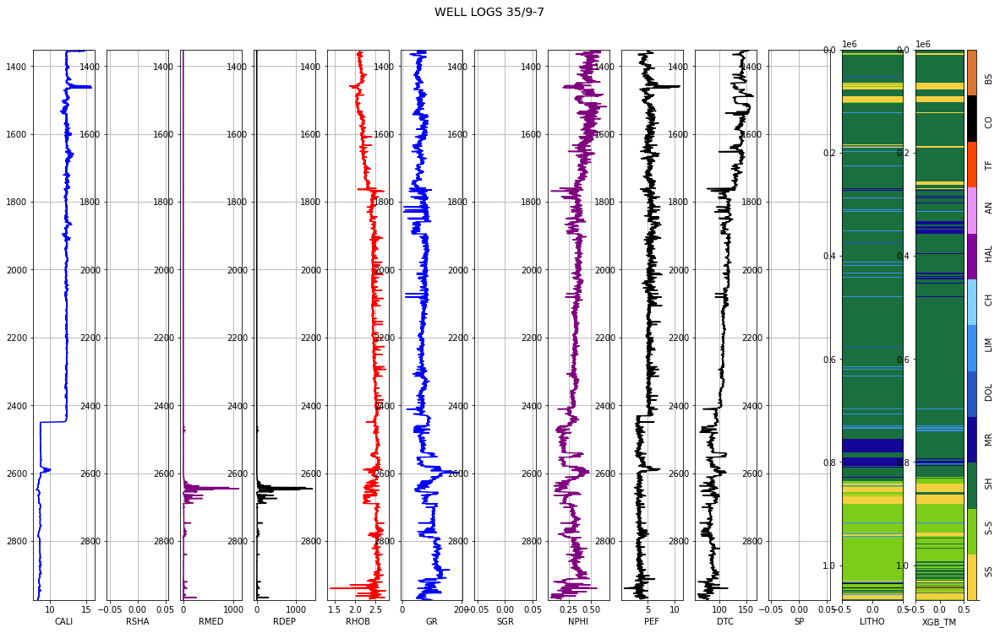

In [39]:
#Plotting HIDDEN SET results
for i in range(10):
  litho_prediction(hidden_xgb_res, i, 1)

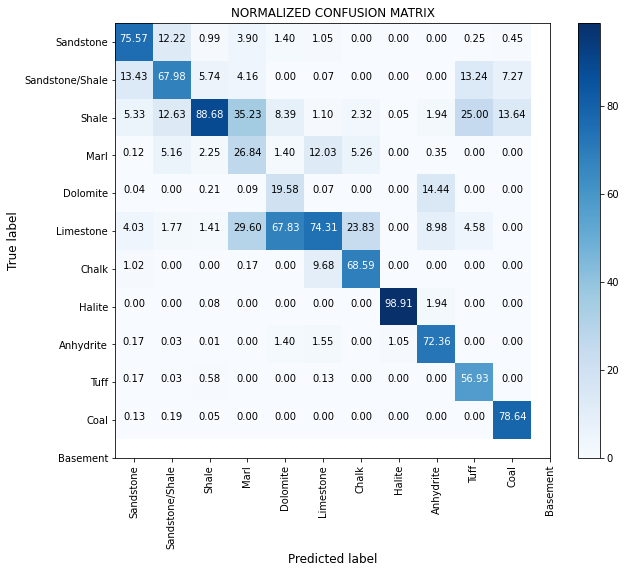

In [ ]:
confusion_matrix(y_hidden.values, hidden_pred_xgb1)

##### Open Set Results

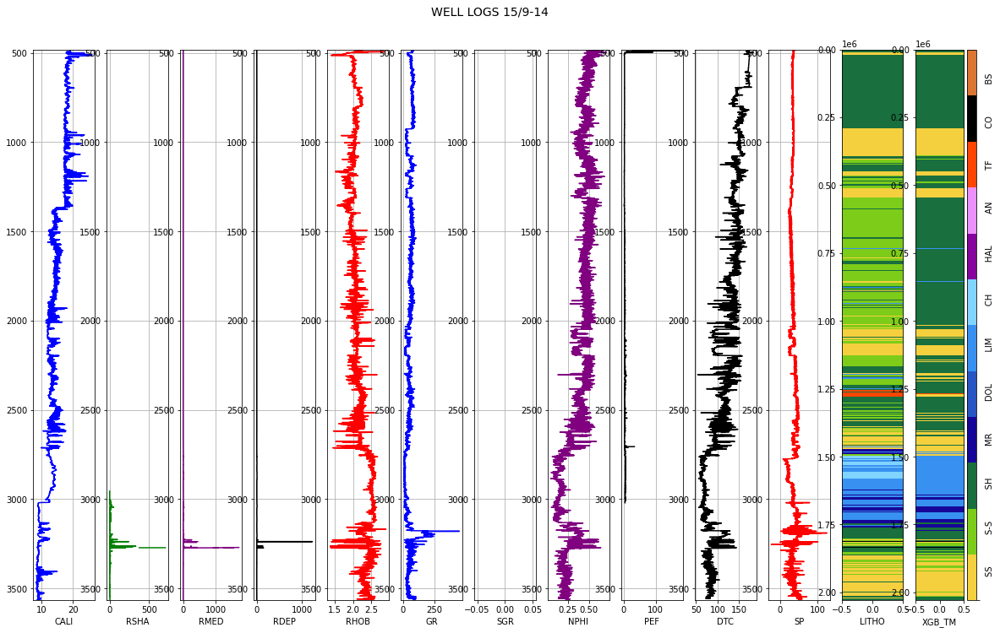

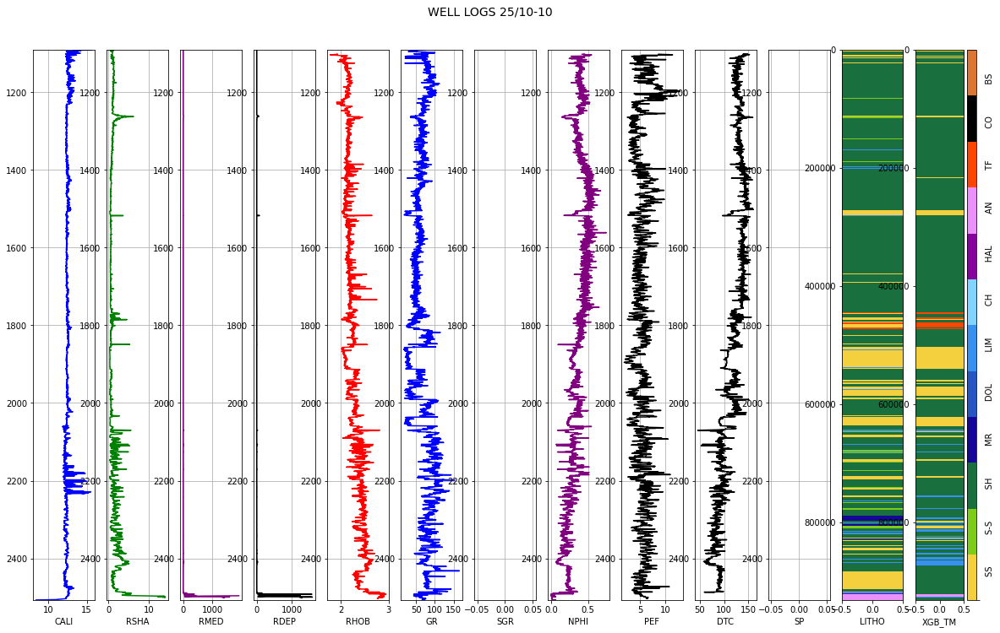

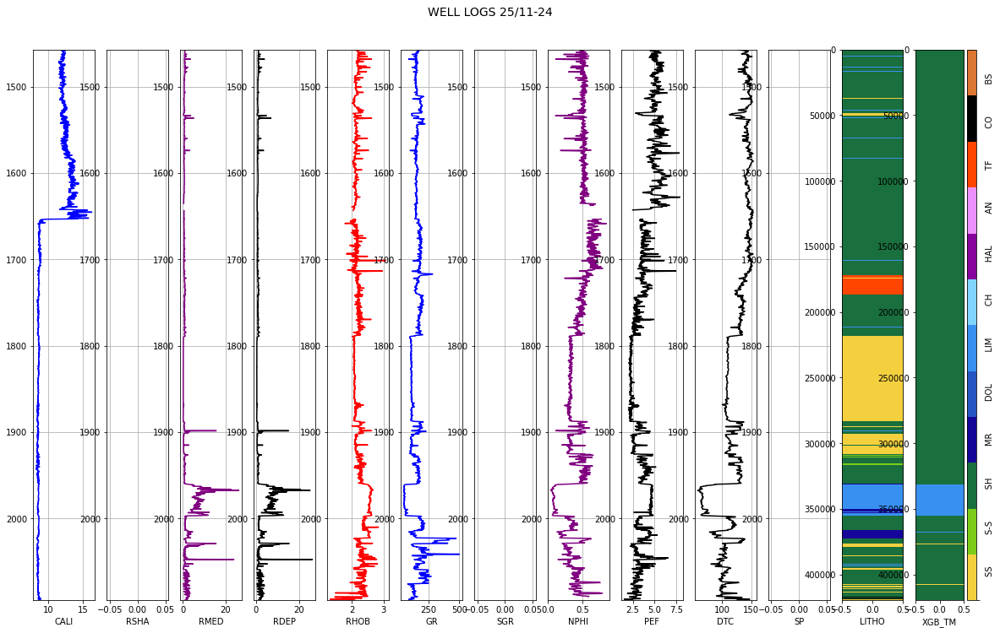

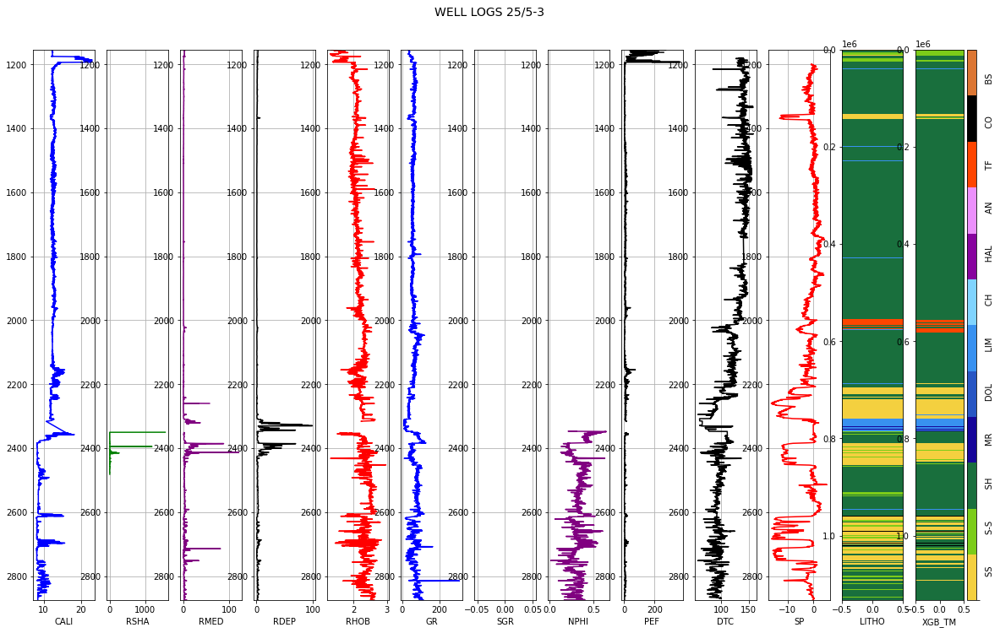

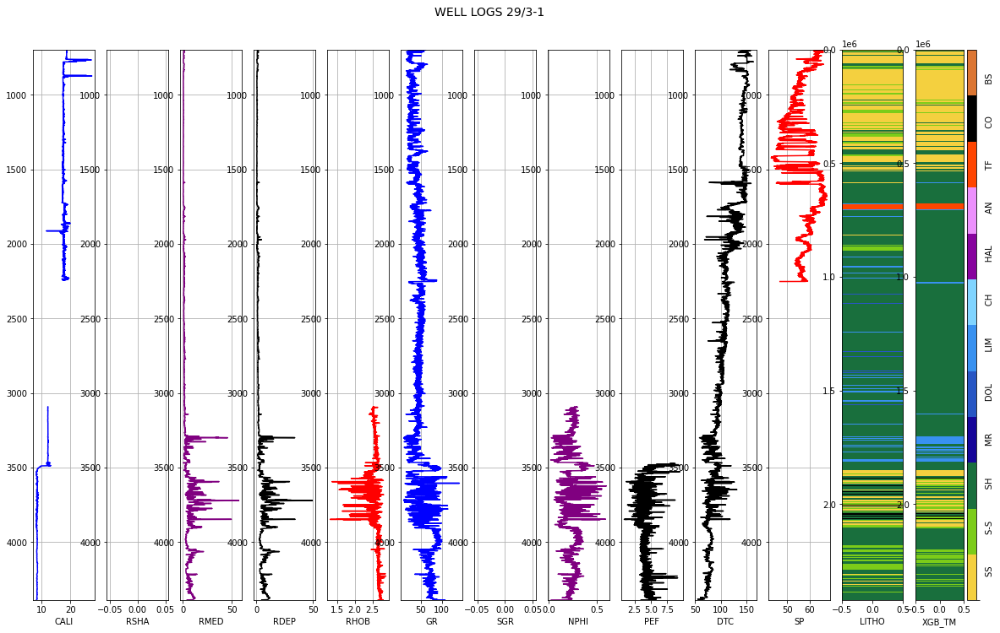

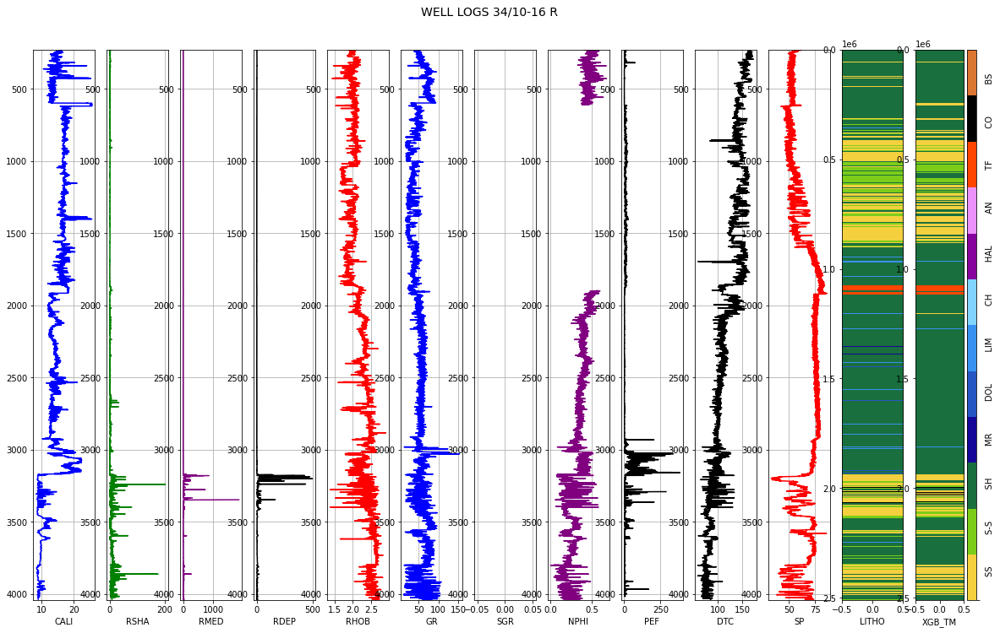

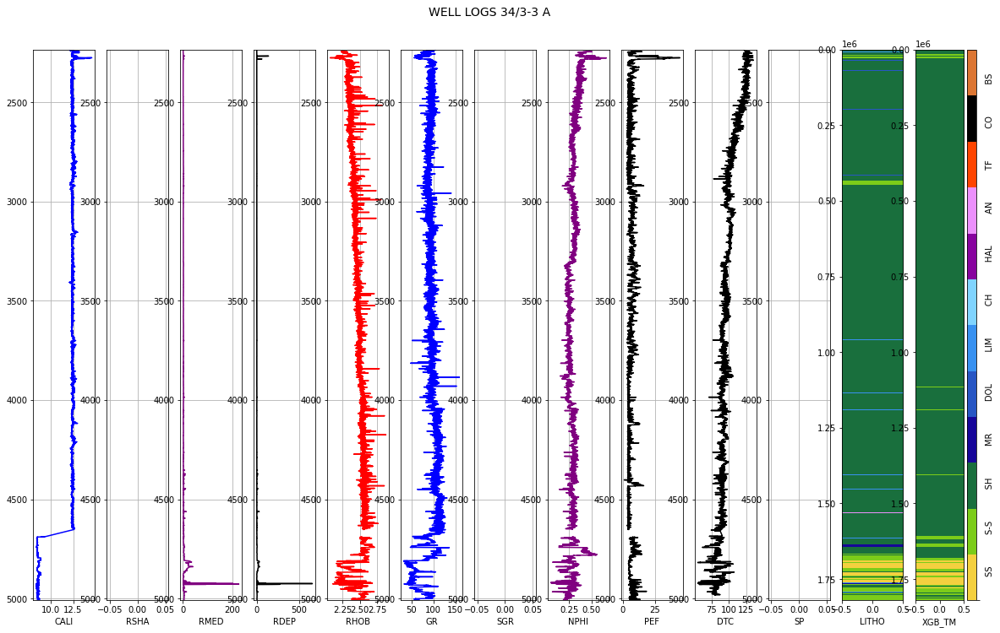

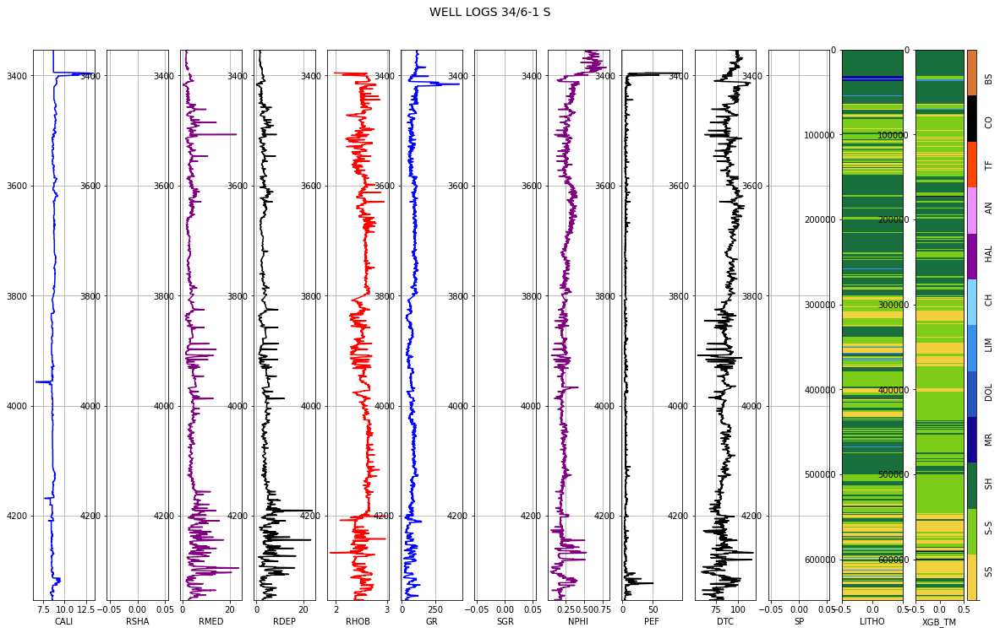

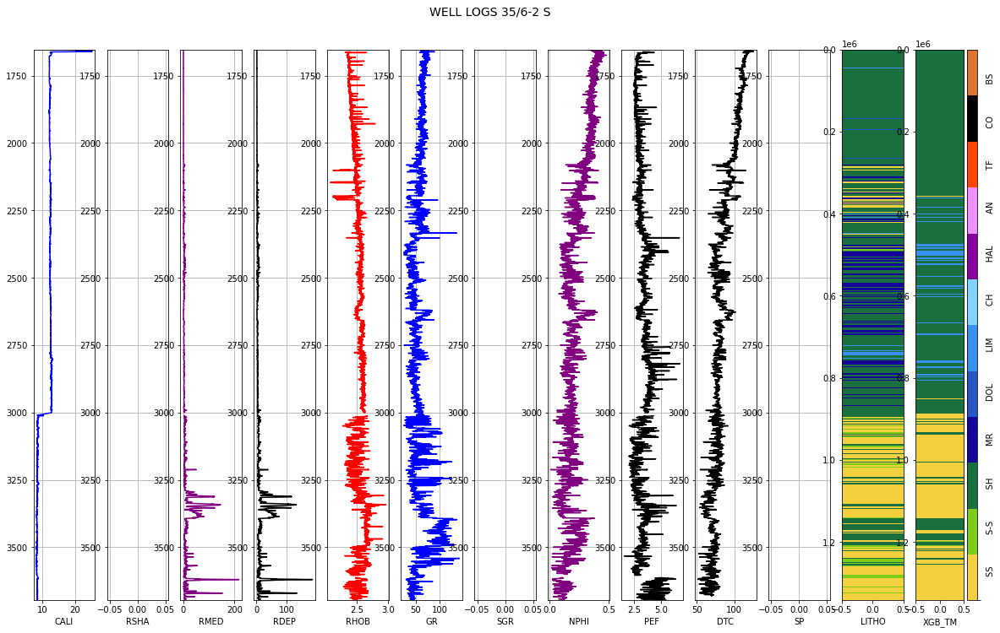

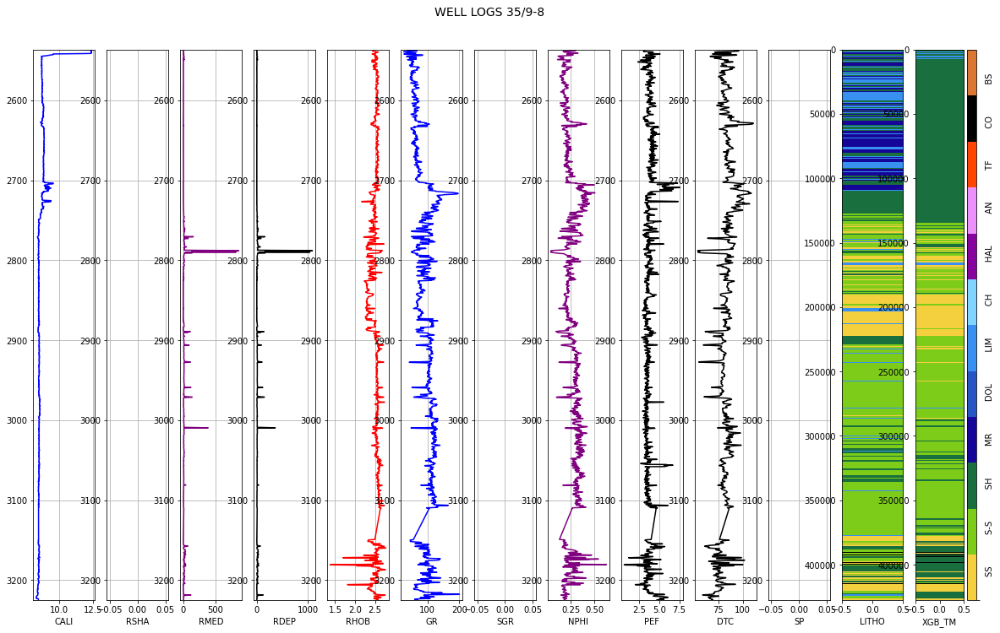

In [40]:
#Plotting OPEN SET results
for i in range(10):
  litho_prediction(test_xgb_res, i, 1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in long_scalars


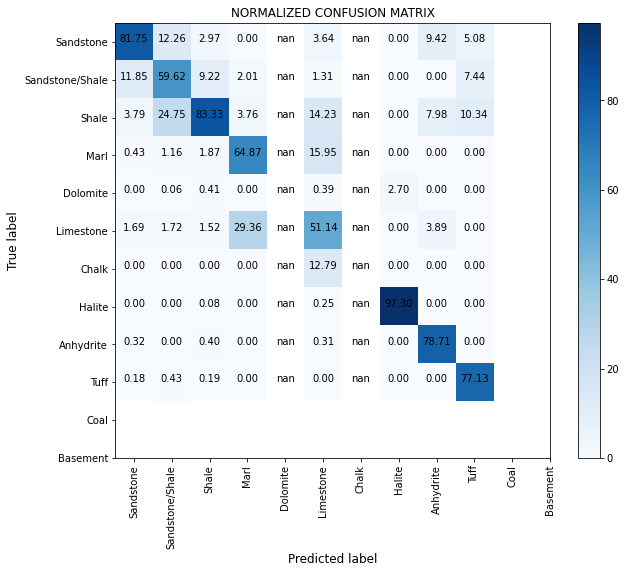

In [ ]:
confusion_matrix(y_test.values, open_pred_xgb1)